#### **1) Libraries**

In [1]:
# !pip install -U tensorflow_probability -q
# !pip install -q ipdb

In [2]:
# prerequisites
import numpy as np
import pandas as pd
import math
import matplotlib
import matplotlib.pyplot as plt
# import seaborn as sns
# sns.set()
import tensorflow as tf
from tensorflow import keras

from tensorflow.keras.datasets import mnist
from tensorflow.keras.layers import Input, InputLayer, Lambda, Reshape, Dropout, \
                                    Flatten, Dense, Conv2D, Conv2DTranspose  
from tensorflow.keras.models import Model
from tensorflow.keras import backend as K
import tensorflow_probability as tfp
from tensorflow_probability import distributions
from scipy.stats import norm, gmean
from scipy import ndimage
from six.moves import urllib
import gzip
import time
import os

from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

If using Google Colab, save in your Google Drive.

In [3]:
from google.colab import drive

drive.mount('/content/gdrive')

Mounted at /content/gdrive


#### **2) MNIST Data**

Preprocess image

In [4]:
SOURCE_URL = 'http://yann.lecun.com/exdb/mnist/'
DATA_DIRECTORY = "data"

IMAGE_SIZE = 28
NUM_CHANNELS = 1
PIXEL_DEPTH = 255
NUM_LABELS = 10
VALIDATION_SIZE = 0  

# DOWNLOAD
def try_download(filename):
    if not tf.io.gfile.exists(DATA_DIRECTORY):
        tf.io.gfile.makedirs(DATA_DIRECTORY)
    filepath = os.path.join(DATA_DIRECTORY, filename)
    if not tf.io.gfile.exists(filepath):
        filepath, _ = urllib.request.urlretrieve(SOURCE_URL + filename, filepath)
        with tf.io.gfile.GFile(filepath) as f:
            size = f.size()
        print('Successfully downloaded', filename, size, 'bytes.')
    return filepath

# GET IMAGES
def get_data(filename, num_images, norm_shift=False, norm_scale=True):
    print('geting', filename)
    with gzip.open(filename) as bytestream:
        bytestream.read(16)
        buf = bytestream.read(IMAGE_SIZE * IMAGE_SIZE * num_images * NUM_CHANNELS)
        data = np.frombuffer(buf, dtype=np.uint8).astype(np.float32)
        if norm_shift:
            data = data - (PIXEL_DEPTH / 2.0)
        if norm_scale:
            data = data / PIXEL_DEPTH
        data = data.reshape(num_images, IMAGE_SIZE, IMAGE_SIZE, NUM_CHANNELS)
        data = np.reshape(data, [num_images, -1])
    return data

# GET LABELS
def get_labels(filename, num_images):
    """get the labels into a vector of int64 label IDs."""
    print('geting', filename)
    with gzip.open(filename) as bytestream:
        bytestream.read(8)
        buf = bytestream.read(1 * num_images)
        labels = np.frombuffer(buf, dtype=np.uint8).astype(np.int64)
        num_labels_data = len(labels)
        one_hot_encoding = np.zeros((num_labels_data,NUM_LABELS))
        one_hot_encoding[np.arange(num_labels_data),labels] = 1
        one_hot_encoding = np.reshape(one_hot_encoding, [-1, NUM_LABELS])
    return one_hot_encoding

# Augment training data
def expend_training_data(images, labels):

    expanded_images = []
    expanded_labels = []

    j = 0 
    for x, y in zip(images, labels):
        j = j+1
        if j%100==0:
            print ('expanding data : %03d / %03d' % (j, np.size(images,0)))

        # register original data
        expanded_images.append(x)
        expanded_labels.append(y)

        # get a value for the background
        # zero is the expected value, but median() is used to estimate background's value
        bg_value = np.median(x) 
        image = np.reshape(x, (-1, 28))

        for i in range(4):
            angle = np.random.randint(-15,15,1)
            new_img = ndimage.rotate(image,angle,reshape=False, cval=bg_value)

            # shift the image with random distance
            shift = np.random.randint(-2, 2, 2)
            new_img_ = ndimage.shift(new_img,shift, cval=bg_value)

            # register new training data
            expanded_images.append(np.reshape(new_img_, 784))
            expanded_labels.append(y)

    # images and labels are concatenated for random-shuffle at each epoch
    # notice that pair of image and label should not be broken
    expanded_train_total_data = np.concatenate((expanded_images, expanded_labels), axis=1)
    np.random.shuffle(expanded_train_total_data)

    return expanded_train_total_data

# MNIST DATA
def prepare_MNIST_data(use_norm_shift=False, use_norm_scale=True, use_data_augmentation=False):
    # Get the data.
    train_data_filename = try_download('train-images-idx3-ubyte.gz')
    train_labels_filename = try_download('train-labels-idx1-ubyte.gz')
    test_data_filename = try_download('t10k-images-idx3-ubyte.gz')
    test_labels_filename = try_download('t10k-labels-idx1-ubyte.gz')

    # get it into numpy arrays.
    train_data = get_data(train_data_filename, 60000, use_norm_shift, use_norm_scale)
    train_labels = get_labels(train_labels_filename, 60000)
    test_data = get_data(test_data_filename, 10000, use_norm_shift, use_norm_scale)
    test_labels = get_labels(test_labels_filename, 10000)

    # Generate a validation set.
    validation_data = train_data[:VALIDATION_SIZE, :]
    validation_labels = train_labels[:VALIDATION_SIZE,:]
    train_data = train_data[VALIDATION_SIZE:, :]
    train_labels = train_labels[VALIDATION_SIZE:,:]

    # Concatenate train_data & train_labels for random shuffle
    if use_data_augmentation:
        train_total_data = expend_training_data(train_data, train_labels)
    else:
        train_total_data = np.concatenate((train_data, train_labels), axis=1)

    train_size = train_total_data.shape[0]

    return train_total_data, train_size, train_data, train_labels, test_data, test_labels

Load the MNIST dataset

In [5]:
train_total_data, train_size, X_train, y_train, X_test, y_test = prepare_MNIST_data(use_norm_shift=False, use_norm_scale=True, use_data_augmentation=False)
temp = np.argmax(y_test, axis=1)
y_test = temp

Successfully downloaded train-images-idx3-ubyte.gz 9912422 bytes.
Successfully downloaded train-labels-idx1-ubyte.gz 28881 bytes.
Successfully downloaded t10k-images-idx3-ubyte.gz 1648877 bytes.
Successfully downloaded t10k-labels-idx1-ubyte.gz 4542 bytes.
geting data/train-images-idx3-ubyte.gz
geting data/train-labels-idx1-ubyte.gz
geting data/t10k-images-idx3-ubyte.gz
geting data/t10k-labels-idx1-ubyte.gz


In [6]:
X_train.shape, y_train.shape

((60000, 784), (60000, 10))

In [7]:
X_test.shape[-1], y_test.shape

(784, (10000,))

#### **3) Model Class**

In [8]:
class CoupledVAE:
    def __init__(self, coupling_dist, coupling_loss, train_dim, z_dim, seed, save_path,
                 batch_size=100, n_hidden=1024, dropout=0.05, learning_rate=1e-3,
                 initializer = keras.initializers.VarianceScaling()
                 # initializer=keras.initializers.VarianceScaling(scale=0.1, mode='fan_in', distribution='normal')
                 ):
        """Convolutional variational autoencoder."""
        # Seed
        self.seed = seed
        np.random.seed(seed)
        tf.random.set_seed(seed)
        # Global variables
        self.coupling_dist = coupling_dist
        self.coupling_loss = coupling_loss
        self.z_dim = z_dim
        self.batch_size = batch_size
        self.n_hidden = n_hidden
        self.dropout = dropout
        self.initializer = initializer
        # Plt plot
        plt.rc('font', size=100, weight='bold')          # controls default text sizes
        plt.rc('axes', titlesize=20)     # fontsize of the axes title
        plt.rc('axes', labelsize=20)    # fontsize of the x and y labels
        plt.rc('xtick', labelsize=20)    # fontsize of the tick labels
        plt.rc('ytick', labelsize=20)    # fontsize of the tick labels
        plt.rc('legend', fontsize=20)    # legend fontsize
        # Encoder
        x = Input(shape=train_dim)
        self.encoder = self._build_encoder_network()  # VAEEncoder
        x_encoded = self.encoder(x)
        # Latent vector
        z = self._get_latent_vector(x_encoded)
        # Decoder
        self.decoder = self._build_decoder_network(train_dim)  # VAEDecoder
        y = self.decoder(z)
        y = tf.clip_by_value(y, 1e-8, 1 - 1e-8)
        # Model
        self.model = self._build_coupled_vae(x, y, learning_rate)
        self.recognizer = Model(x, self.mean_vector)
        self.generator = self._build_generator()
        # Save path
        self.save_path = save_path

    def _build_encoder_network(self):
        return keras.Sequential(
            [
                Dense(self.n_hidden, activation='elu', kernel_initializer=self.initializer, bias_initializer='zeros'),
                Dropout(self.dropout),
                Dense(self.n_hidden, activation='tanh', kernel_initializer=self.initializer, bias_initializer='zeros'),
                Dropout(self.dropout)
            ]
        )

    def _get_latent_vector(self, x_encoded):
        gaussian_params = Dense(self.z_dim*2, kernel_initializer=self.initializer, bias_initializer='zeros')(x_encoded)
        self.mean_vector = gaussian_params[:, :self.z_dim]
        self.std_vector = 1e-6 + tf.nn.softplus(gaussian_params[:, self.z_dim:])
        z = Lambda(self._sampling, output_shape=(self.z_dim,))([self.mean_vector, self.std_vector])
        return z

    def _sampling(self, args):
        mean_vector, std_vector = args
        assert self.coupling_dist >= 0, "Coupling distribution variable must be greater or equal to 0." 
        if self.coupling_dist == 0:
            # Use normal Gaussian if coupling_dist == 0
            # Reparameterization trick
            eps = K.random_normal(shape=(self.batch_size, self.z_dim), mean=0., stddev=1.0)
        else:
            # Use Student-T (approx. coupled-Gaussian) if coupling_dist > 0
            mvt = distributions.MultivariateStudentTLinearOperator(df=1/self.coupling_dist,
                                                                   loc=np.zeros(self.z_dim),
                                                                   # sqrt(1 - 2 * coupling_dist) so target std limits to 1 
                                                                   scale=tf.linalg.LinearOperatorLowerTriangular(np.identity(self.z_dim))
                                                                   )
            # Modify epsilon to sample from Coupled-gaussians instead of Gaussians.
            eps = mvt.sample(sample_shape=(self.batch_size))
            eps = tf.dtypes.cast(eps, tf.float32)
        return mean_vector + K.exp(std_vector)*math.sqrt(self.coupling_dist)*eps # mean_vector + (K.exp(std_vector)*math.sqrt(1 - 2*self.coupling_dist))*eps

    def _build_decoder_network(self, train_dim):
        return keras.Sequential(
            [
                Dense(self.n_hidden, activation='tanh', kernel_initializer=self.initializer, bias_initializer='zeros'),
                Dropout(self.dropout),
                Dense(self.n_hidden, activation='elu', kernel_initializer=self.initializer, bias_initializer='zeros'),
                Dropout(self.dropout),
                Dense(train_dim[0], activation='sigmoid', kernel_initializer=self.initializer, bias_initializer='zeros')
            ]
        )

    def _build_coupled_vae(self, x, y, learning_rate):
        model = Model(x, y)
        model.add_loss(self._compute_loss(x, y))
        opt = keras.optimizers.Adam(learning_rate=learning_rate)
        model.compile(optimizer=opt)
        return model

    def _compute_loss(self, x, y):
        coupling_loss = self.coupling_loss
        mean_vector = self.mean_vector
        std_vector = self.std_vector
        d = self.z_dim
        # Nonextensive statistical mechanics
        # q_tsallis = 1 + 2*coupling_loss/(1 + d*coupling_loss)
        d1 = 1 + d*coupling_loss + 2*coupling_loss  # What is d1?
        #### Latent loss and image loss for Coupled VAE.
        marginal_likelihood = tf.reduce_sum(x * tf.subtract(tf.pow(y, (2*coupling_loss) / (1 + coupling_loss)), 1) / (2*coupling_loss) + (1 - x)
                                            * tf.subtract(tf.pow(1 - y, (2 * coupling_loss) / (1 + coupling_loss)), 1) / (coupling_loss*2), 1)
        kl_d1 = tf.reduce_prod(tf.pow(2 * tf.constant(math.pi), coupling_loss/(1 + d*coupling_loss)) * tf.sqrt(d1 / (d1 - 2*coupling_loss*tf.square(std_vector)))
                            * tf.exp(tf.square(mean_vector)*d1*coupling_loss / (1 + d*coupling_loss) / (d1 - 2*coupling_loss*tf.square(std_vector))), 1)
        kl_d2 = tf.reduce_prod(tf.pow(2 * tf.constant(math.pi)*tf.square(std_vector),
                                    coupling_loss / (1 + coupling_loss*d)) * tf.sqrt(d1 / (1 + d*coupling_loss)), 1)
        kl_divergence = (kl_d1 - kl_d2) / coupling_loss / 2
        kl_divergence = tf.reduce_mean(kl_divergence)
        marginal_likelihood = tf.reduce_mean(marginal_likelihood)
        # ELBO method
        elbo = marginal_likelihood - kl_divergence
        vae_loss = -elbo
        return vae_loss

    def _build_generator(self):
        decoder_input = Input(shape=(self.z_dim,))
        _y = self.decoder(decoder_input)
        generator = Model(decoder_input, _y)
        return generator

    def summary(self):
        return self.model.summary()

    def generator_summary(self):
        return self.generator.summary()

    def fit(self, X_train, **kwargs):
        print("=====================================================================================")
        print(f"Training Coupled VAE: coupling distribution = {self.coupling_dist}, coupling loss = {self.coupling_loss}, seed = {self.seed}")
        self.model.fit(X_train, **kwargs)

    def display(self, X_test, y_test, n=15, digit_size=28):
        print("=====================================================================================")
        print(f"Displaying Coupled VAE: coupling distribution = {self.coupling_dist}, coupling loss = {self.coupling_loss}, seed = {self.seed}")
        # Append save paths for display plots
        self.display_path = self.save_path + '/display'
        # Display latent space
        self._display_latent_space(X_test, y_test)
        # Display a 2D manifold of the digits, with 15x15 digits figure
        if self.z_dim == 2:
            self._display_manifold(n, digit_size, X_test)
        # Get overall_values
        overall_values = self._get_overall_values(X_test)
        # Display histogram (passed in 'overall_original_values' as overall_values)
        self._display_histogram(overall_values)

    def _display_latent_space(self, X_test, y_test):
        # Plot of the digit classes in the latent space
        X_test_latent = self.recognizer.predict(X_test, batch_size=self.batch_size)
        colors = ['pink', 'red', 'orange', 'yellow', 'green', 'blue', 'purple', 'brown', 'gray']
        plt.figure(figsize=(10, 10))
        plt.scatter(X_test_latent[:, 0], X_test_latent[:, 1], c=y_test, 
                    cmap=matplotlib.colors.ListedColormap(colors)
                    )
        plt.colorbar()
        plt.savefig(f'{self.display_path}/latent_spaces/latent_cd{self.coupling_dist}_cl{self.coupling_loss}.png')
        plt.show();

    def _get_overall_values(self, X_test):
        coupling_loss = self.coupling_loss
        overall_values = []
        for i in range(len(X_test)):
          input_test = np.resize(X_test[i],(1,784))
          output = self.model.predict(input_test)
          x = input_test
          y = output[0]

          x = tf.convert_to_tensor(x)
          y = tf.convert_to_tensor(y)

          marginal_likelihood = tf.reduce_mean(tf.reduce_sum(x * tf.subtract(tf.pow(y, (2 * coupling_loss) / (1 + coupling_loss)), 1) / (2 * coupling_loss) + (1 - x)
                                                * tf.subtract(tf.pow(1 - y, (2 * coupling_loss) / (1 + coupling_loss)), 1) / (coupling_loss * 2), 1))
          marginal_likelihood = tf.cast(marginal_likelihood, tf.float32).numpy()
          overall_values.append(marginal_likelihood)
        return overall_values

    def _display_manifold(self, n, digit_size, X_test):
        figure = np.zeros((digit_size * n, digit_size * n))
        grid_x = norm.ppf(np.linspace(0.05, 0.95, n)) 
        grid_y = norm.ppf(np.linspace(0.05, 0.95, n))
        # Display a 2D manifold of the digits and also output overall values
        for i, yi in enumerate(grid_x):
            for j, xi in enumerate(grid_y):
                #z_sample = np.array([[xi, yi]])
                #x_decoded = self.generator.predict(z_sample)
                #digit = x_decoded[0].reshape(digit_size, digit_size)
                input_test = np.resize(X_test[j*len(grid_x) + i],(1,784))
                output = self.model.predict(input_test)
                digit = output[0].reshape(digit_size, digit_size)
                #digit = input_test.reshape(digit_size, digit_size)
                figure[i * digit_size: (i + 1) * digit_size, j * digit_size: (j + 1) * digit_size] = digit

        plt.figure(figsize=(20, 20))
        plt.imshow(figure, cmap='Greys_r')
        plt.savefig(f'{self.display_path}/manifolds/mani_cd{self.coupling_dist}_cl{self.coupling_loss}.png')
        plt.show();

    def _display_histogram(self, overall_values):
        log_probability_values = self._calculate_generalized_mean(overall_values)
        # The histogram of the data
        fig, ax = plt.subplots(figsize=(24, 10))
        xtick_labels = ['1e-240', '1e-210', '1e-180', '1e-150', '1e-120', '1e-90', '1e-60', '1e-30', '1']
        ax.set_xticks([math.log(1e-240), math.log(1e-210), math.log(1e-180), math.log(1e-150), math.log(1e-120), math.log(1e-90), math.log(1e-60), math.log(1e-30), math.log(1)])
        ax.set_xticklabels(xtick_labels)
        plt.title('Histogram for Coupled VAE', fontdict = {'fontsize' : 40, 'weight': 'bold'})
        plt.xlabel('Probability of reconstructed image equivalent to original one.', fontdict = {'fontsize' : 40, 'weight': 'bold'})
        plt.ylabel('Frequency in logscale.', fontdict = {'fontsize' : 40, 'weight': 'bold'})
        plt.axvline(self.log_decisiveness, color='r', linestyle='dashed', linewidth=2)
        plt.axvline(self.log_accuracy, color='b', linestyle='dashed', linewidth=2)
        plt.axvline(self.log_robustness, color='g', linestyle='dashed', linewidth=2)
        plt.hist(log_probability_values, log=True, bins=100, facecolor='white', edgecolor='black')
        plt.savefig(f'{self.display_path}/histograms/hist_cd{self.coupling_dist}_cl{self.coupling_loss}.png')
        plt.show();

    def _calculate_generalized_mean(self, overall_values):
        probability_values = [math.exp(record) for record in overall_values]
        self.log_decisiveness = math.log(self._calculate_decisiveness(probability_values))
        self.log_accuracy = math.log(self._calculate_accuracy(probability_values))
        self.log_robustness = math.log(self._calculate_robustness(probability_values))
        log_probability_values = [math.log(record) for record in probability_values]
        return log_probability_values

    def _calculate_decisiveness(self, overall_values): 
        result = sum(overall_values) / float(len(overall_values))
        return result

    def _calculate_accuracy(self, overall_values) : 
        # Multiply elements one by one 
        result = 1
        for x in overall_values: 
            temp = x ** (1/float(len(overall_values))) 
            result = result * temp
        return result

    def _calculate_robustness(self, overall_values):
        result = 0
        for x in overall_values:
            result = result + (x ** (-2/3))
        result = (result / float(len(overall_values))) ** (-3/2)
        return result

    def get_generalized_mean(self):
        print(f"Decisiveness (Arithmetic Mean): {math.exp(self.log_decisiveness):.4e}")
        print(f"Accuracy (Geometric Mean): {math.exp(self.log_accuracy):.4e}")
        print(f"Robustness (-2/3 Mean): {math.exp(self.log_robustness):.4e}")
        return math.exp(self.log_decisiveness), math.exp(self.log_accuracy), math.exp(self.log_robustness)

    def save_model(self):
        # TensorFlow SavedModel default format
        self.model.save(f'{self.save_path}/model/cvae_cd{self.coupling_dist}_cl{self.coupling_loss}')

#### **4) Models Train**

In [9]:
def run_cvae_loop(X_train, X_test, y_test, coupling_dist_list, coupling_loss_list, seed_list,
                  save_path, z_dim=2, batch_size=100, n_epoch = 100, n_hidden = 1024, 
                  dropout=0.05, learning_rate=1e-3, shuffle=True, verbose=1,
                  ):

    cvae_list = {}
    for seed in seed_list:
        cvae_list_seed = {}
        for coupling_dist in coupling_dist_list:
            for coupling_loss in coupling_loss_list:
                start_time = time.time()
                cvae = CoupledVAE(coupling_dist=coupling_dist,
                                  coupling_loss=coupling_loss,
                                  train_dim=X_train.shape[1:],
                                  z_dim=z_dim,
                                  batch_size=batch_size,
                                  n_hidden=n_hidden,
                                  dropout=dropout,
                                  learning_rate=learning_rate,
                                  seed=seed,
                                  save_path=save_path+f'/seed{seed}'
                                  )
                cvae.fit(X_train,
                        shuffle=shuffle,
                        epochs=n_epoch,
                        batch_size=batch_size,
                        validation_data=(X_test, None),
                        verbose=verbose,
                        )
                cvae_list_seed[f'cvae_kd{coupling_dist}_kl{coupling_loss}'] = cvae
                end_time = time.time()
                run_time = (end_time - start_time)/60
                print(f"Run time: {run_time:.2f} min")
                print()
        cvae_list[f'seed{seed}'] = cvae_list_seed
    return cvae_list

In [10]:
# matrix code
coupling_dist_list = [1e-6, 0.01, 0.05, 0.1, 0.15]
coupling_loss_list = [1e-6, 0.025, 0.05, 0.075, 0.1, 0.125, 0.15, 0.175, 0.2, 0.225, 0.25]
seed_list = [0]
# seed_list = [0, 1, 2, 10, 25, 42, 50, 64, 78, 99]
# train_dim = X_train.shape[1:]
z_dim = 20

batch_size = 5000
n_epoch = 500
n_hidden = 500
dropout = 0.1
learning_rate = 1e-3
# shuffle = True
verbose = 0
# set path to your specified Drive directory
save_path = 'gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3'

In [11]:
%%time
cvae_list = run_cvae_loop(X_train, X_test, y_test, coupling_dist_list, coupling_loss_list, seed_list,
                          save_path, z_dim=z_dim, batch_size=batch_size, n_epoch=n_epoch,
                          n_hidden=n_hidden, learning_rate=learning_rate, verbose=verbose
                          )

Instructions for updating:
Do not pass `graph_parents`.  They will  no longer be used.
Training Coupled VAE: coupling distribution = 1e-06, coupling loss = 1e-06, seed = 0
Instructions for updating:
This op will be removed after the deprecation date. Please switch to tf.sets.difference().
Run time: 1.37 min

Training Coupled VAE: coupling distribution = 1e-06, coupling loss = 0.025, seed = 0
Run time: 1.25 min

Training Coupled VAE: coupling distribution = 1e-06, coupling loss = 0.05, seed = 0
Run time: 1.25 min

Training Coupled VAE: coupling distribution = 1e-06, coupling loss = 0.075, seed = 0
Run time: 1.25 min

Training Coupled VAE: coupling distribution = 1e-06, coupling loss = 0.1, seed = 0
Run time: 1.24 min

Training Coupled VAE: coupling distribution = 1e-06, coupling loss = 0.125, seed = 0
Run time: 1.25 min

Training Coupled VAE: coupling distribution = 1e-06, coupling loss = 0.15, seed = 0
Run time: 1.25 min

Training Coupled VAE: coupling distribution = 1e-06, coupling lo

#### **5) Models Save and Display**

In [12]:
comparison = {}

Displaying Coupled VAE: coupling distribution = 1e-06, coupling loss = 1e-06, seed = 0


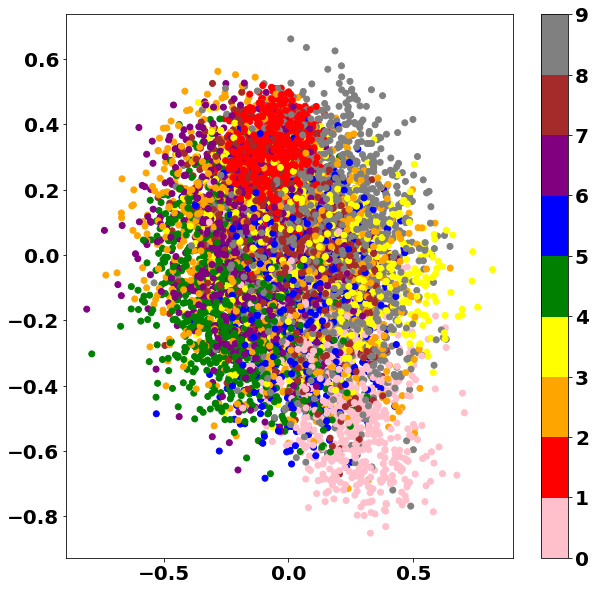

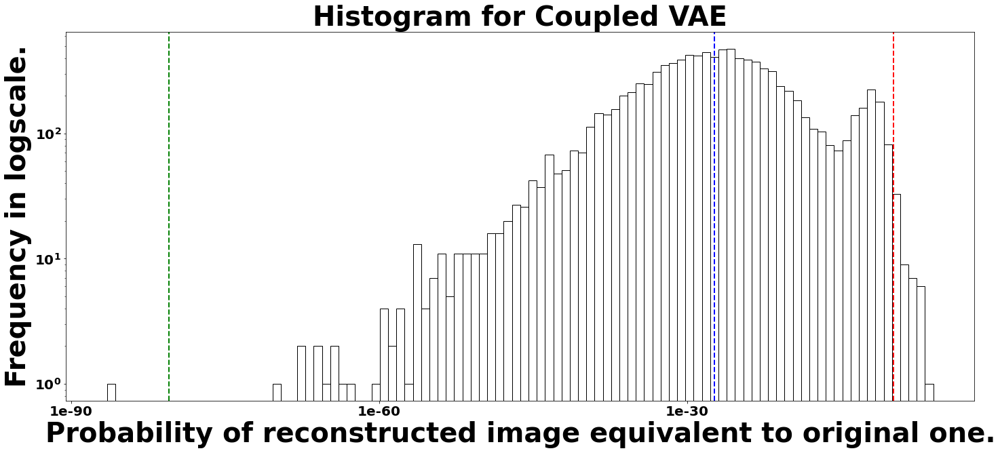

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd1e-06_cl1e-06/assets
Decisiveness (Arithmetic Mean): 1.3572e-10
Accuracy (Geometric Mean): 4.7068e-28
Robustness (-2/3 Mean): 3.4641e-81
Run time: 7.53 min

Displaying Coupled VAE: coupling distribution = 1e-06, coupling loss = 0.025, seed = 0


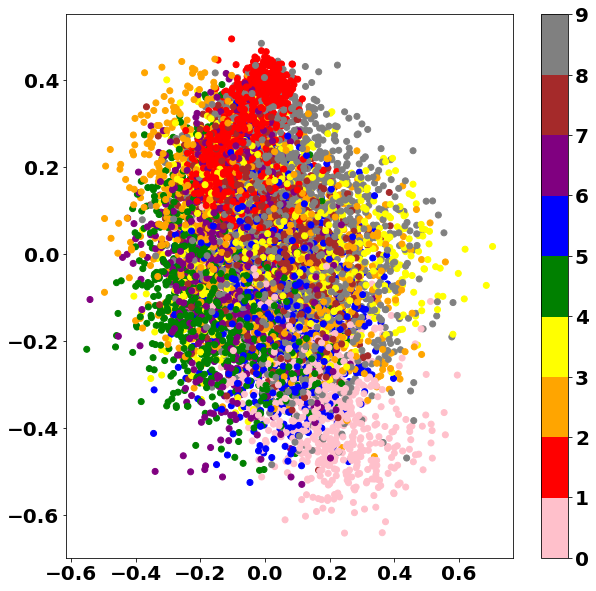

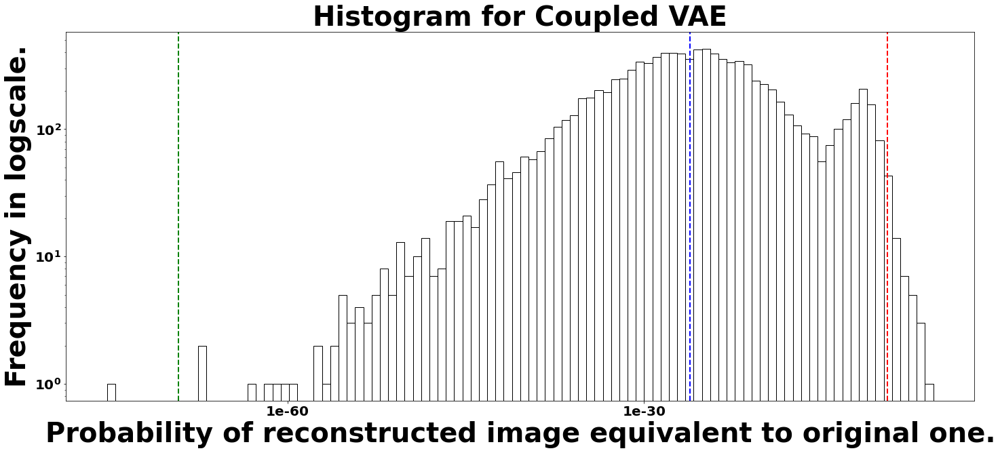

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd1e-06_cl0.025/assets
Decisiveness (Arithmetic Mean): 2.9431e-10
Accuracy (Geometric Mean): 7.7900e-27
Robustness (-2/3 Mean): 7.1459e-70
Run time: 7.68 min

Displaying Coupled VAE: coupling distribution = 1e-06, coupling loss = 0.05, seed = 0


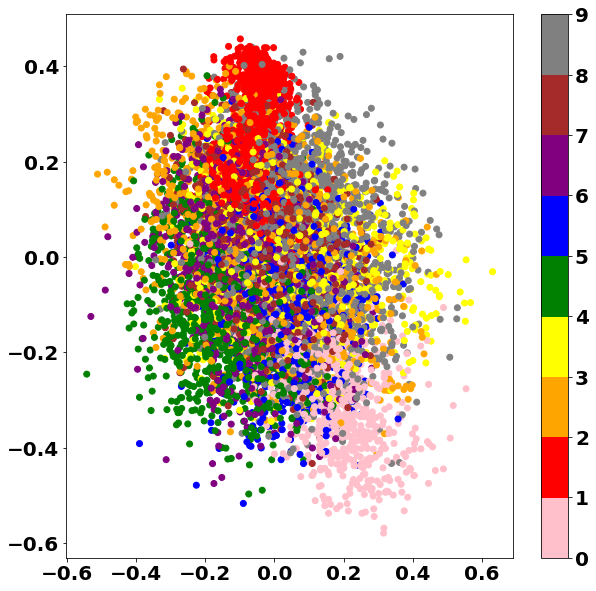

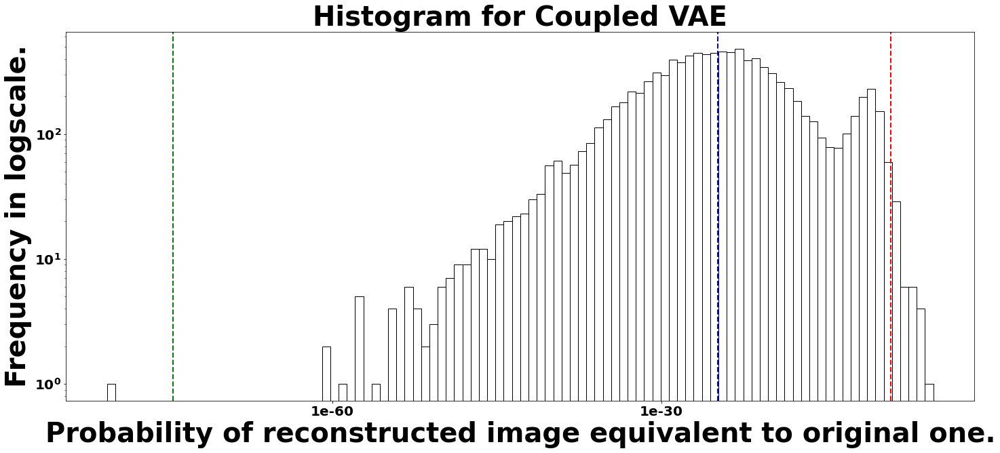

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd1e-06_cl0.05/assets
Decisiveness (Arithmetic Mean): 8.4701e-10
Accuracy (Geometric Mean): 1.3417e-25
Robustness (-2/3 Mean): 3.0758e-75
Run time: 7.74 min

Displaying Coupled VAE: coupling distribution = 1e-06, coupling loss = 0.075, seed = 0


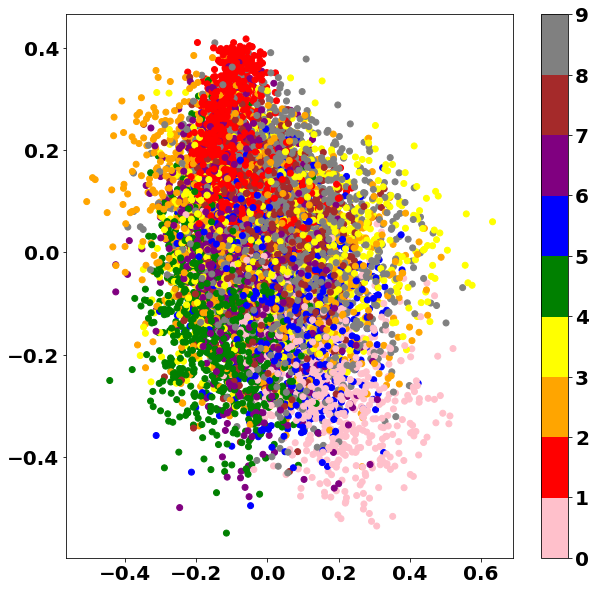

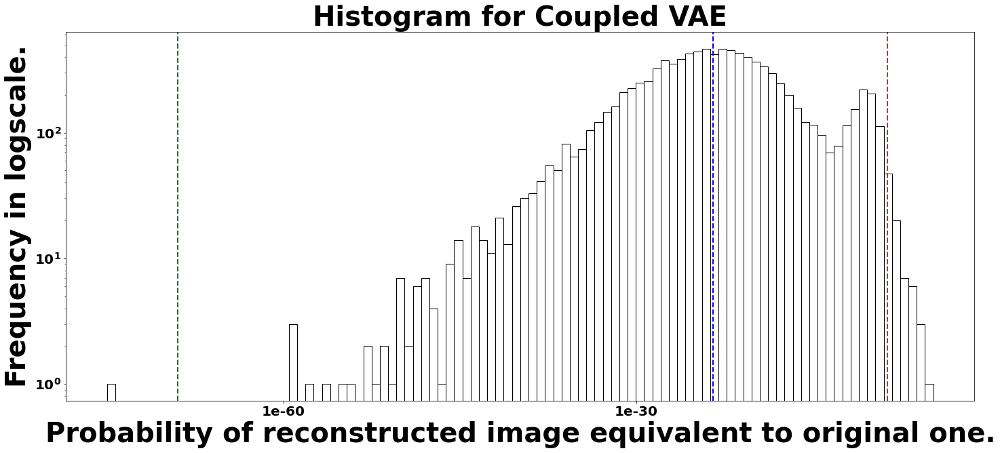

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd1e-06_cl0.075/assets
Decisiveness (Arithmetic Mean): 2.2874e-09
Accuracy (Geometric Mean): 3.2469e-24
Robustness (-2/3 Mean): 1.0858e-69
Run time: 7.80 min

Displaying Coupled VAE: coupling distribution = 1e-06, coupling loss = 0.1, seed = 0


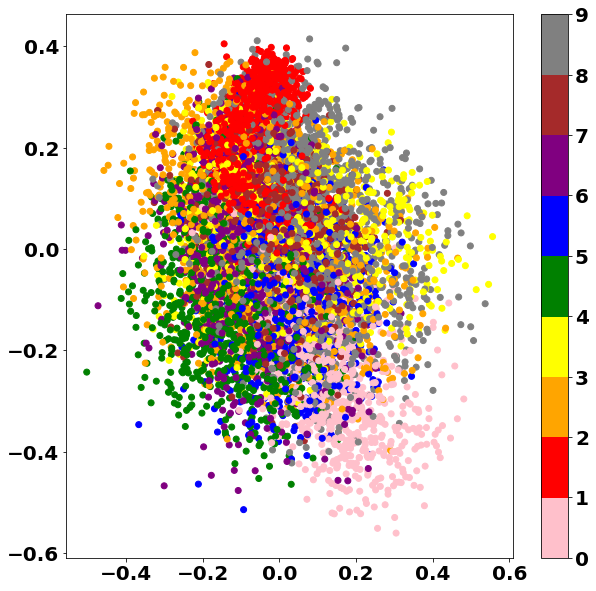

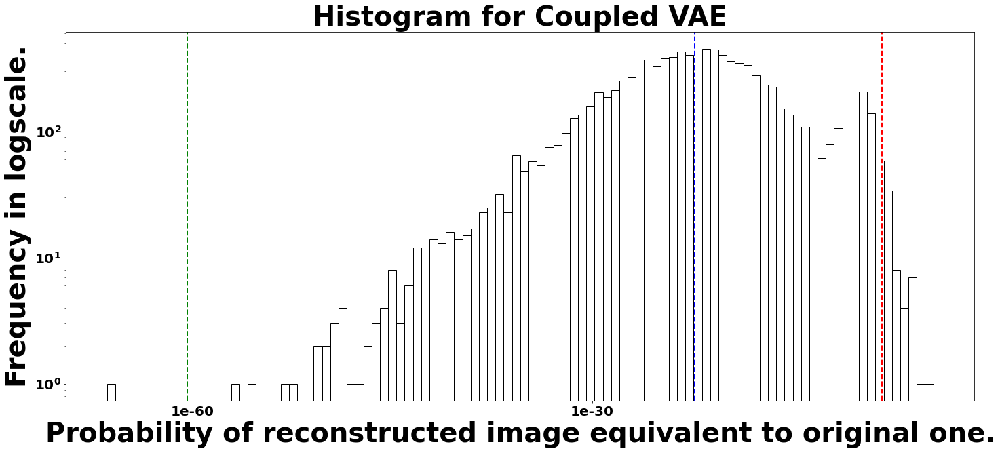

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd1e-06_cl0.1/assets
Decisiveness (Arithmetic Mean): 5.7101e-09
Accuracy (Geometric Mean): 5.4014e-23
Robustness (-2/3 Mean): 4.0318e-61
Run time: 7.72 min

Displaying Coupled VAE: coupling distribution = 1e-06, coupling loss = 0.125, seed = 0


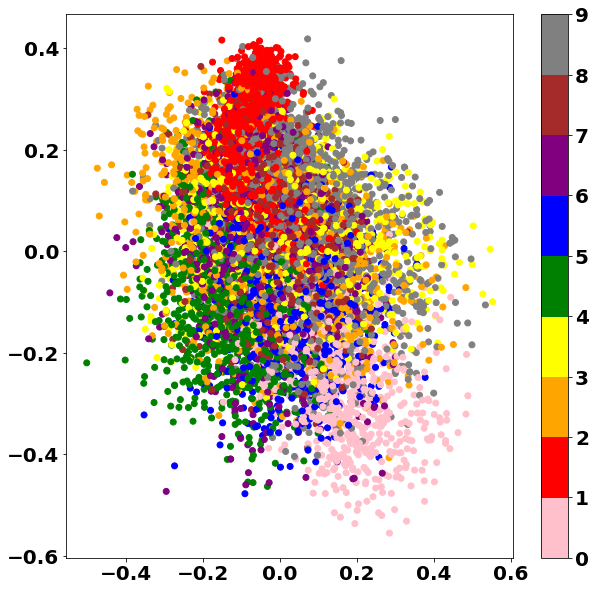

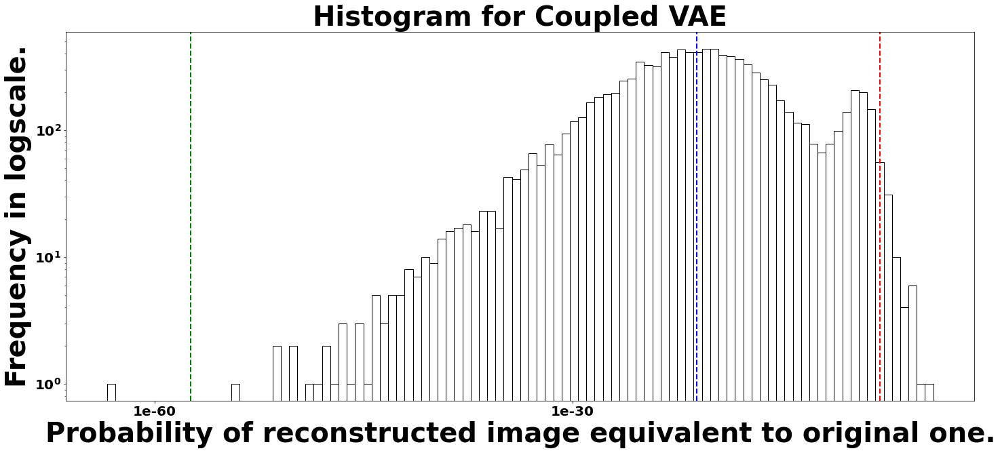

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd1e-06_cl0.125/assets
Decisiveness (Arithmetic Mean): 1.0739e-08
Accuracy (Geometric Mean): 8.1722e-22
Robustness (-2/3 Mean): 4.1469e-58
Run time: 7.62 min

Displaying Coupled VAE: coupling distribution = 1e-06, coupling loss = 0.15, seed = 0


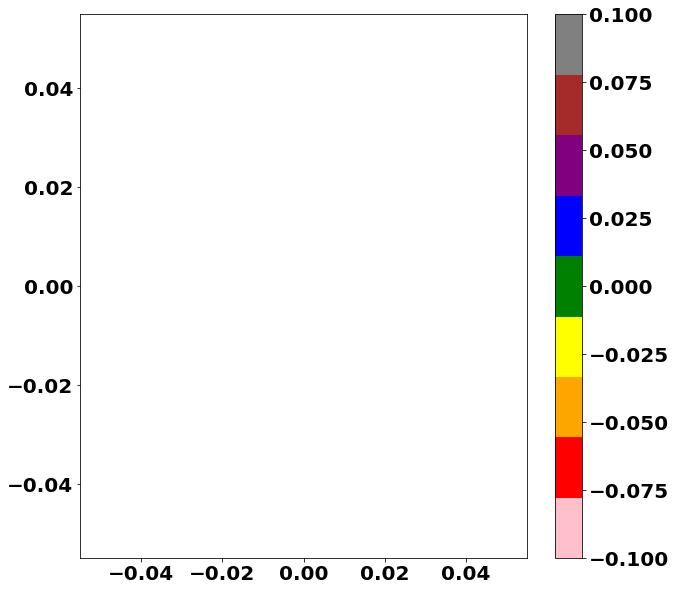

Failed to retrieve generalized mean values due to ValueError, thus set to NaN.
Run time: 7.20 min

Displaying Coupled VAE: coupling distribution = 1e-06, coupling loss = 0.175, seed = 0


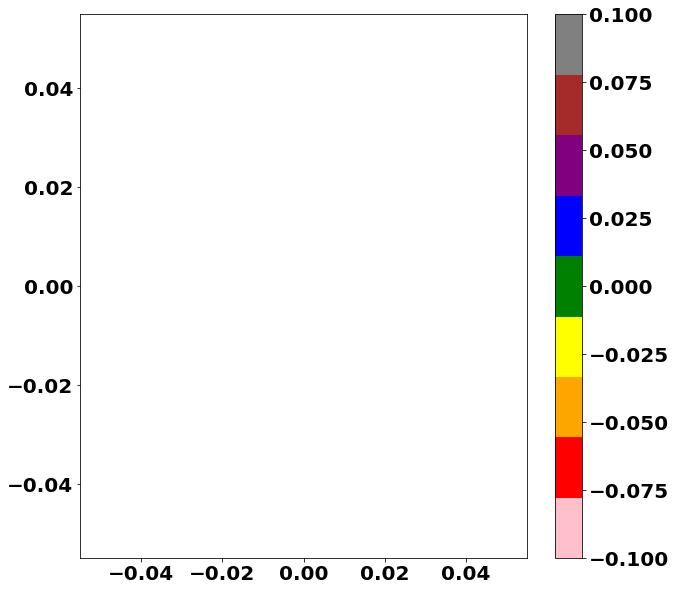

Failed to retrieve generalized mean values due to ValueError, thus set to NaN.
Run time: 7.05 min

Displaying Coupled VAE: coupling distribution = 1e-06, coupling loss = 0.2, seed = 0


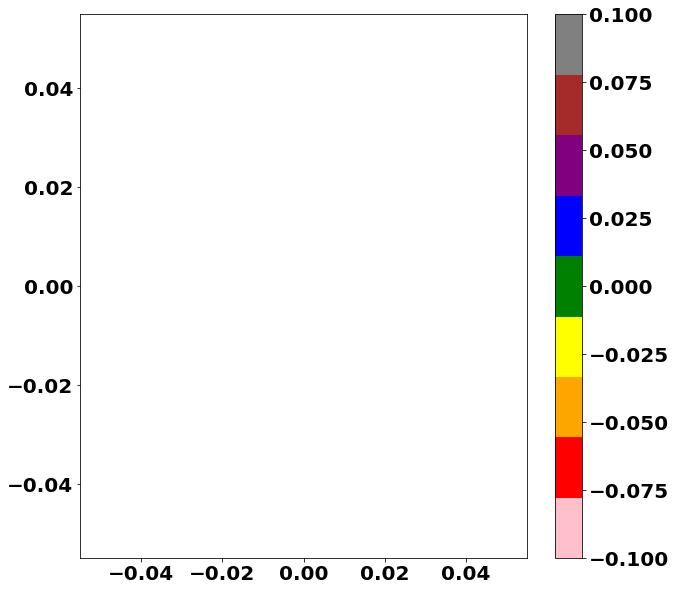

Failed to retrieve generalized mean values due to ValueError, thus set to NaN.
Run time: 6.91 min

Displaying Coupled VAE: coupling distribution = 1e-06, coupling loss = 0.225, seed = 0


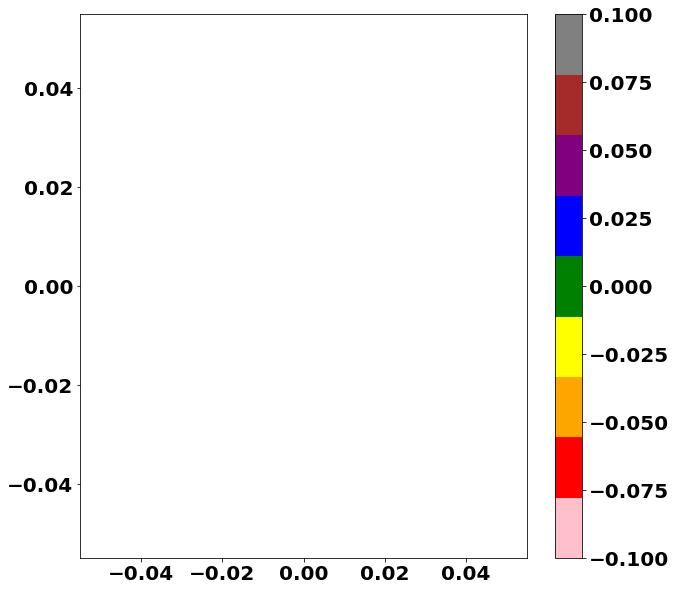

Failed to retrieve generalized mean values due to ValueError, thus set to NaN.
Run time: 6.94 min

Displaying Coupled VAE: coupling distribution = 1e-06, coupling loss = 0.25, seed = 0


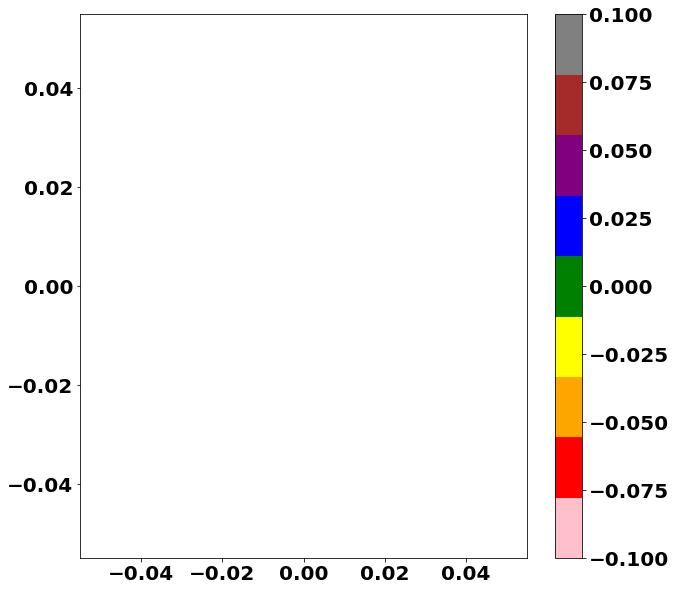

Failed to retrieve generalized mean values due to ValueError, thus set to NaN.
Run time: 6.87 min

Displaying Coupled VAE: coupling distribution = 0.01, coupling loss = 1e-06, seed = 0


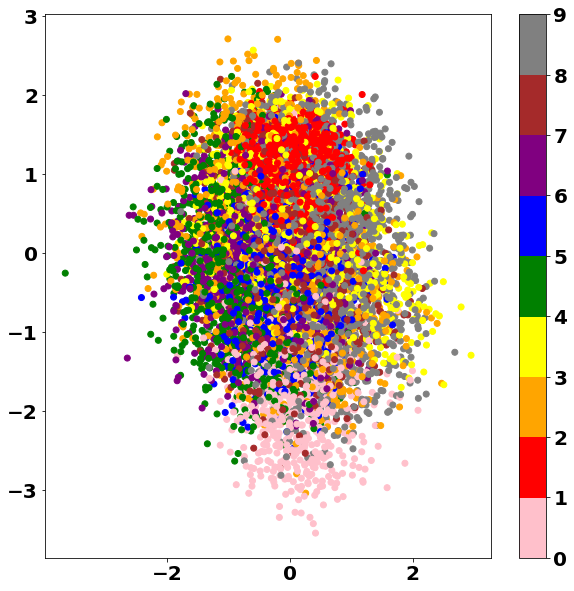

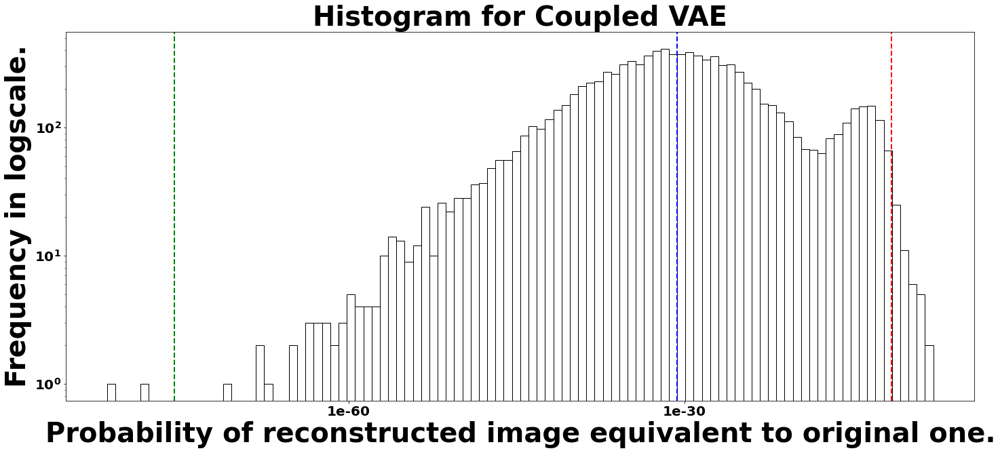

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd0.01_cl1e-06/assets
Decisiveness (Arithmetic Mean): 3.4914e-12
Accuracy (Geometric Mean): 2.1780e-31
Robustness (-2/3 Mean): 2.4651e-76
Run time: 7.05 min

Displaying Coupled VAE: coupling distribution = 0.01, coupling loss = 0.025, seed = 0


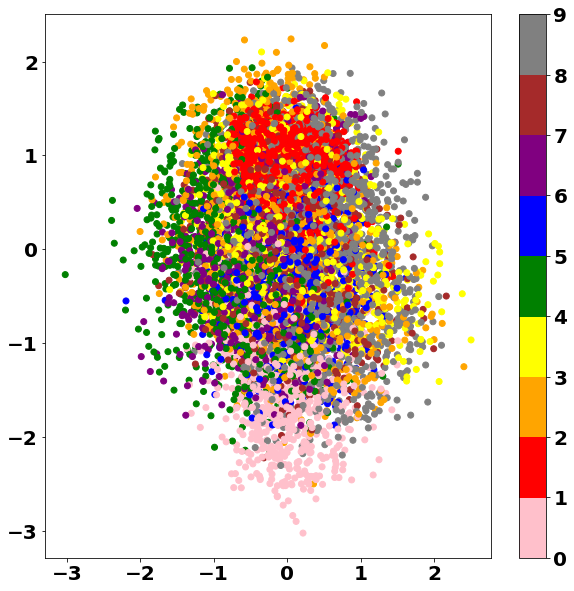

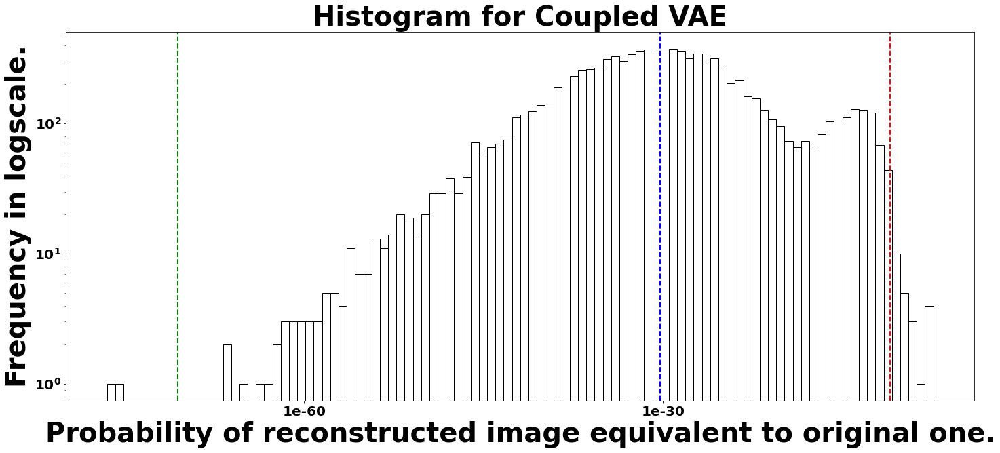

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd0.01_cl0.025/assets
Decisiveness (Arithmetic Mean): 9.3240e-12
Accuracy (Geometric Mean): 5.5805e-31
Robustness (-2/3 Mean): 2.7376e-71
Run time: 7.00 min

Displaying Coupled VAE: coupling distribution = 0.01, coupling loss = 0.05, seed = 0


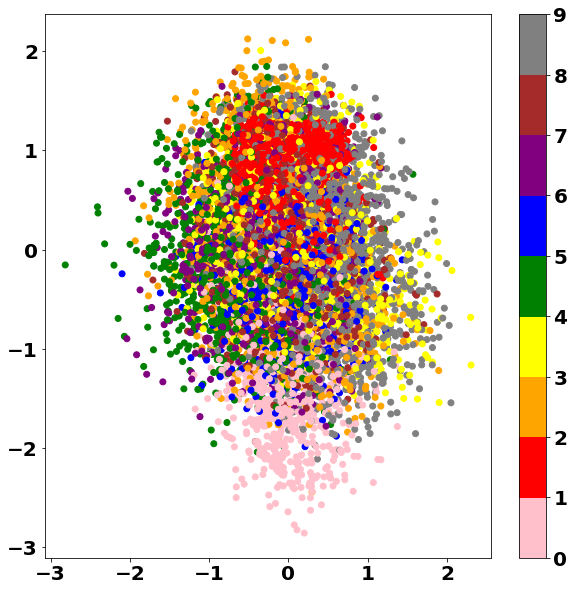

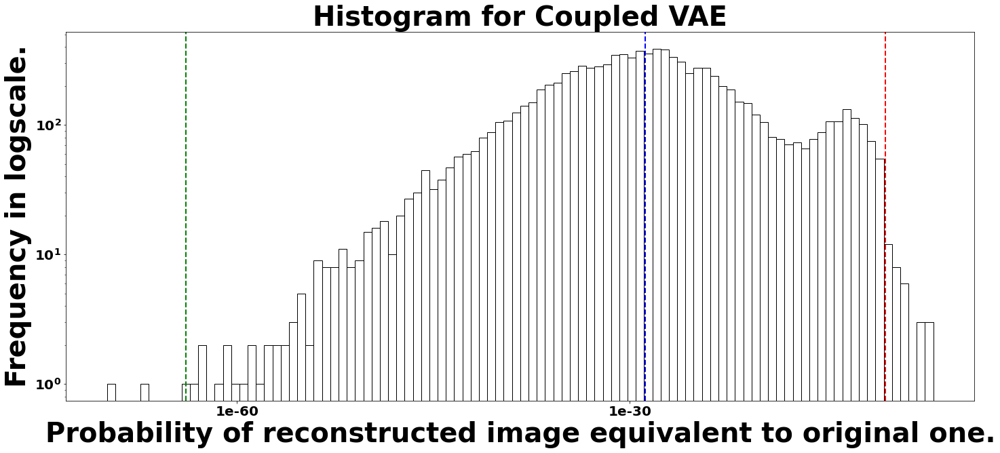

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd0.01_cl0.05/assets
Decisiveness (Arithmetic Mean): 3.3553e-11
Accuracy (Geometric Mean): 1.4866e-29
Robustness (-2/3 Mean): 1.2195e-64
Run time: 7.16 min

Displaying Coupled VAE: coupling distribution = 0.01, coupling loss = 0.075, seed = 0


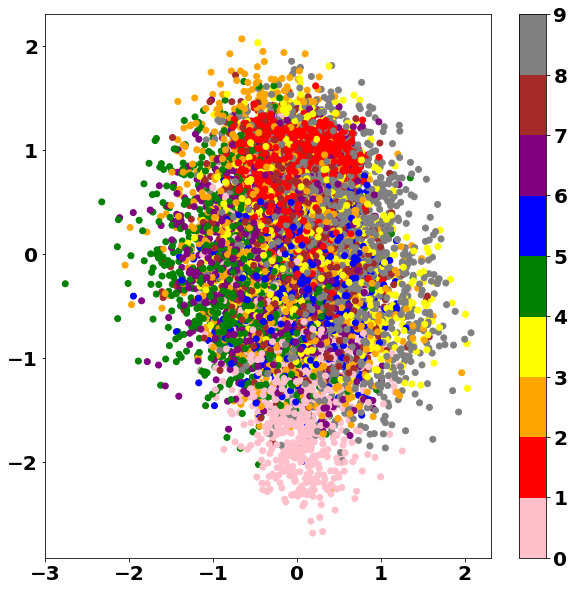

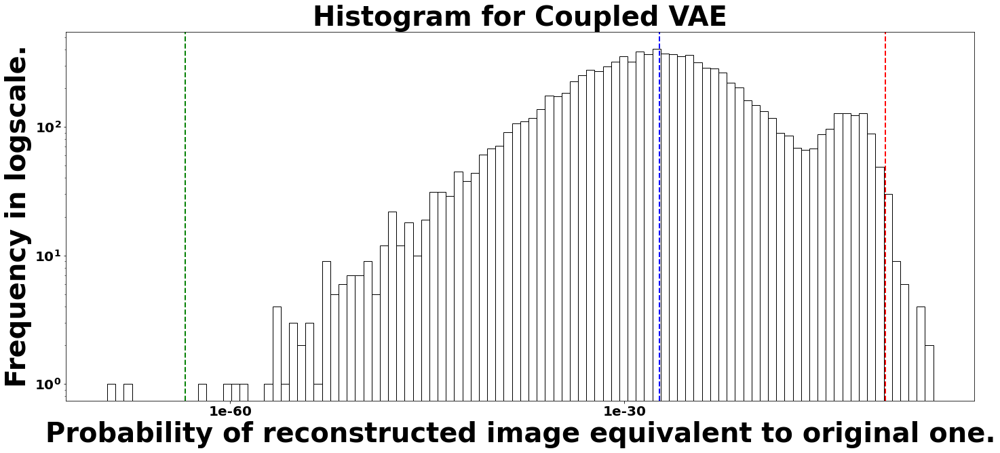

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd0.01_cl0.075/assets
Decisiveness (Arithmetic Mean): 6.9161e-11
Accuracy (Geometric Mean): 4.6090e-28
Robustness (-2/3 Mean): 3.8831e-64
Run time: 7.09 min

Displaying Coupled VAE: coupling distribution = 0.01, coupling loss = 0.1, seed = 0


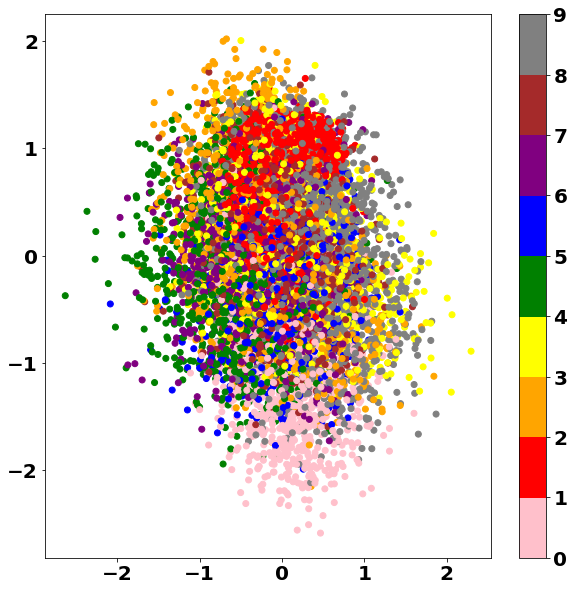

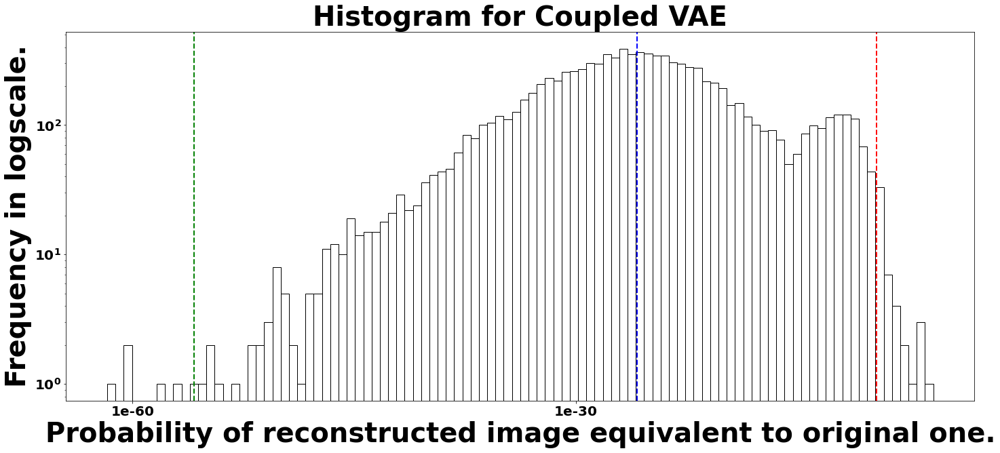

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd0.01_cl0.1/assets
Decisiveness (Arithmetic Mean): 2.4351e-10
Accuracy (Geometric Mean): 1.4513e-26
Robustness (-2/3 Mean): 1.4958e-56
Run time: 7.01 min

Displaying Coupled VAE: coupling distribution = 0.01, coupling loss = 0.125, seed = 0


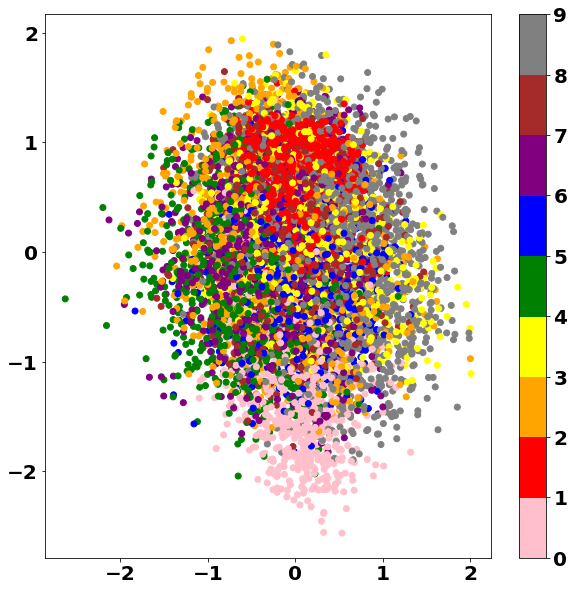

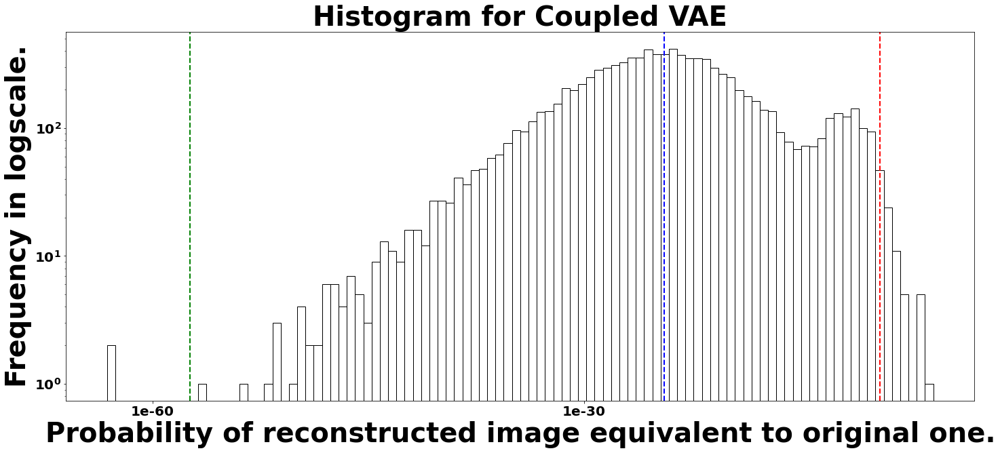

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd0.01_cl0.125/assets
Decisiveness (Arithmetic Mean): 3.4907e-10
Accuracy (Geometric Mean): 3.7322e-25
Robustness (-2/3 Mean): 4.2002e-58
Run time: 6.95 min

Displaying Coupled VAE: coupling distribution = 0.01, coupling loss = 0.15, seed = 0


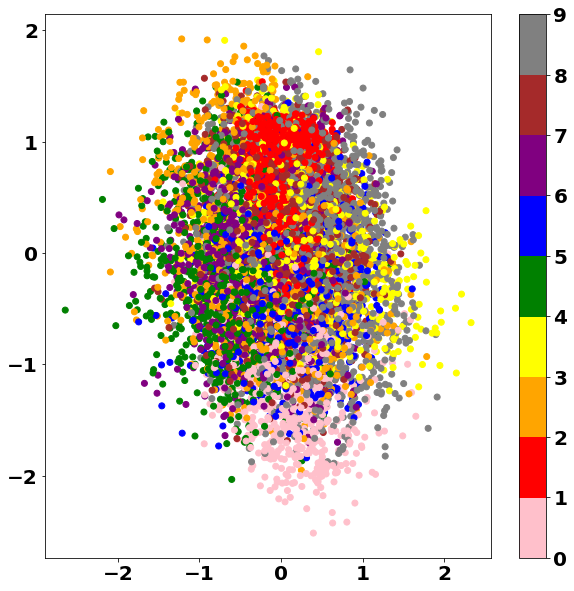

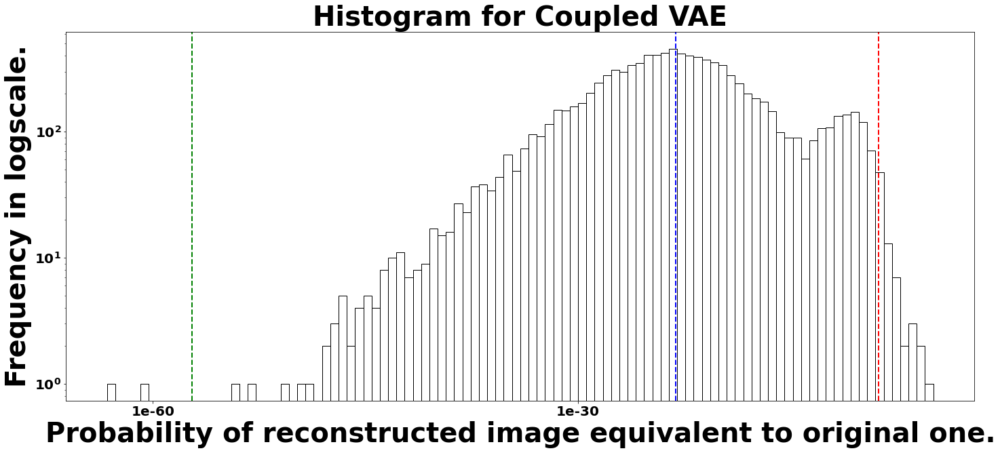

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd0.01_cl0.15/assets
Decisiveness (Arithmetic Mean): 1.6260e-09
Accuracy (Geometric Mean): 7.5863e-24
Robustness (-2/3 Mean): 5.8438e-58
Run time: 6.98 min

Displaying Coupled VAE: coupling distribution = 0.01, coupling loss = 0.175, seed = 0


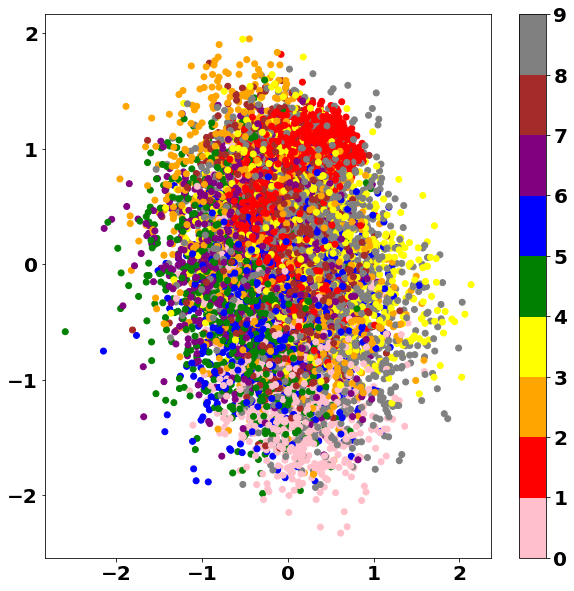

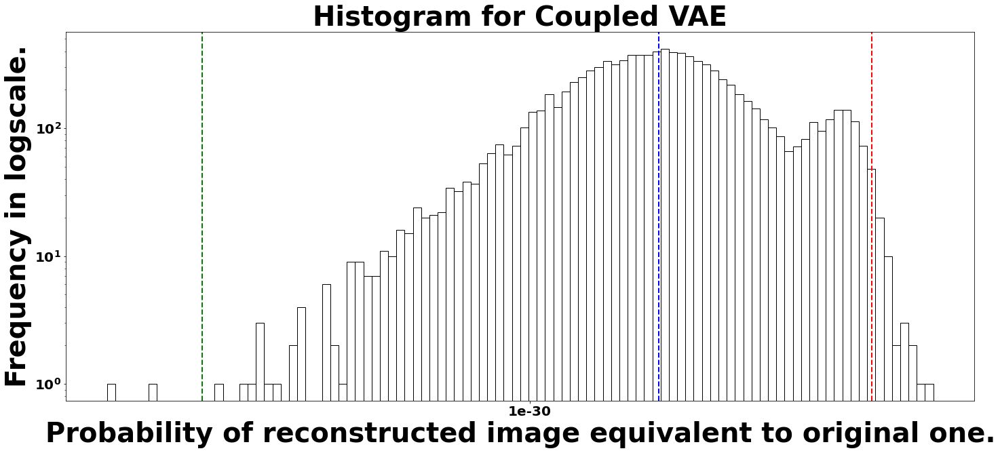

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd0.01_cl0.175/assets
Decisiveness (Arithmetic Mean): 4.2039e-09
Accuracy (Geometric Mean): 1.4086e-22
Robustness (-2/3 Mean): 2.0279e-51
Run time: 7.21 min

Displaying Coupled VAE: coupling distribution = 0.01, coupling loss = 0.2, seed = 0


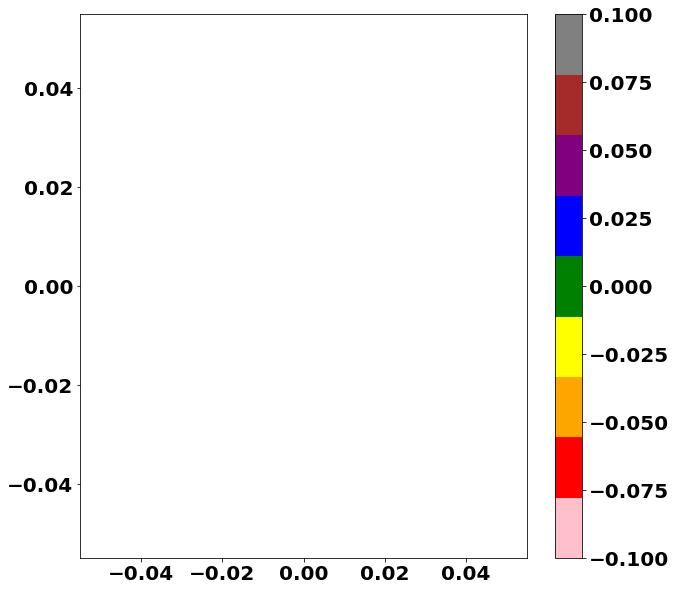

Failed to retrieve generalized mean values due to ValueError, thus set to NaN.
Run time: 7.32 min

Displaying Coupled VAE: coupling distribution = 0.01, coupling loss = 0.225, seed = 0


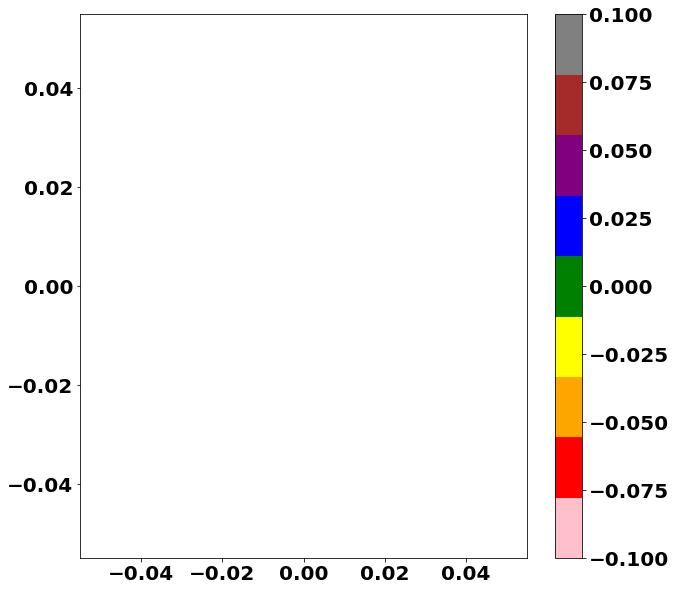

Failed to retrieve generalized mean values due to ValueError, thus set to NaN.
Run time: 7.23 min

Displaying Coupled VAE: coupling distribution = 0.01, coupling loss = 0.25, seed = 0


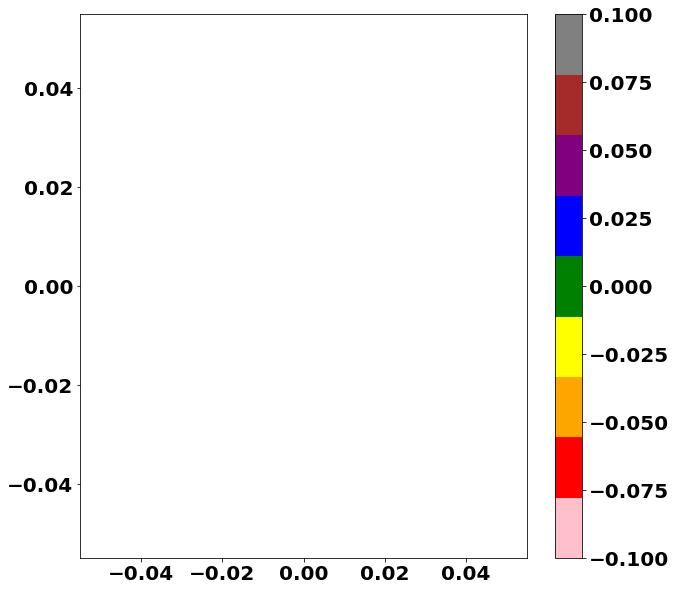

Failed to retrieve generalized mean values due to ValueError, thus set to NaN.
Run time: 7.11 min

Displaying Coupled VAE: coupling distribution = 0.05, coupling loss = 1e-06, seed = 0


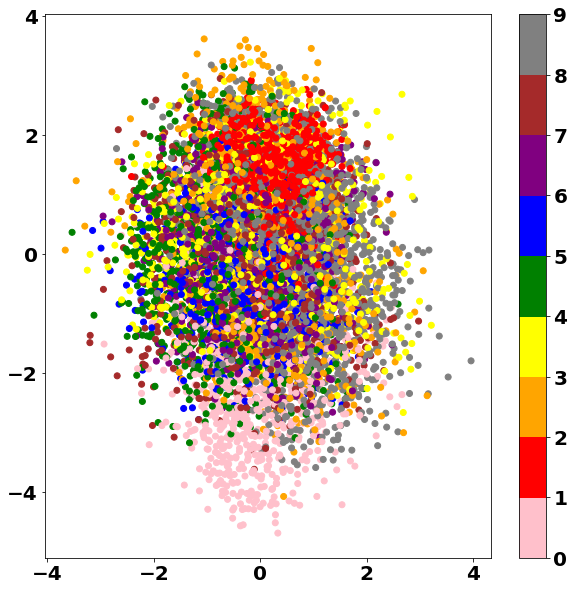

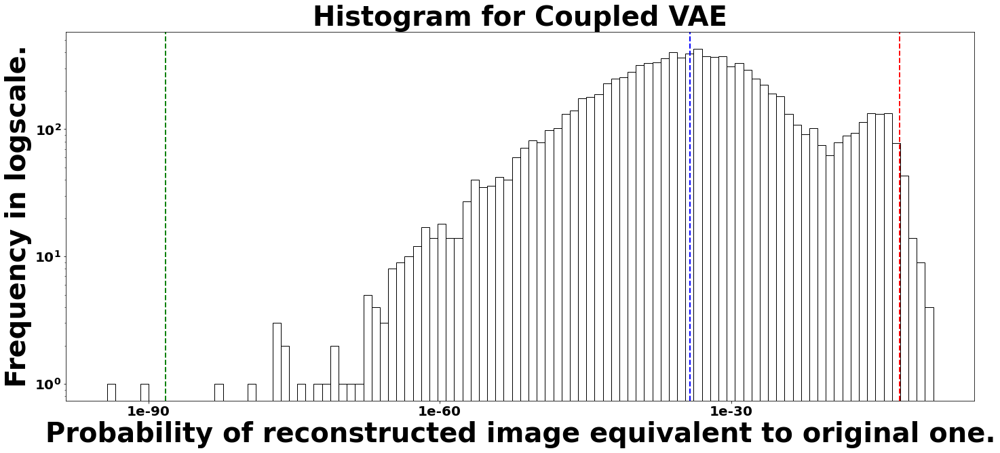

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd0.05_cl1e-06/assets
Decisiveness (Arithmetic Mean): 2.2967e-13
Accuracy (Geometric Mean): 5.5993e-35
Robustness (-2/3 Mean): 5.9150e-89
Run time: 7.22 min

Displaying Coupled VAE: coupling distribution = 0.05, coupling loss = 0.025, seed = 0


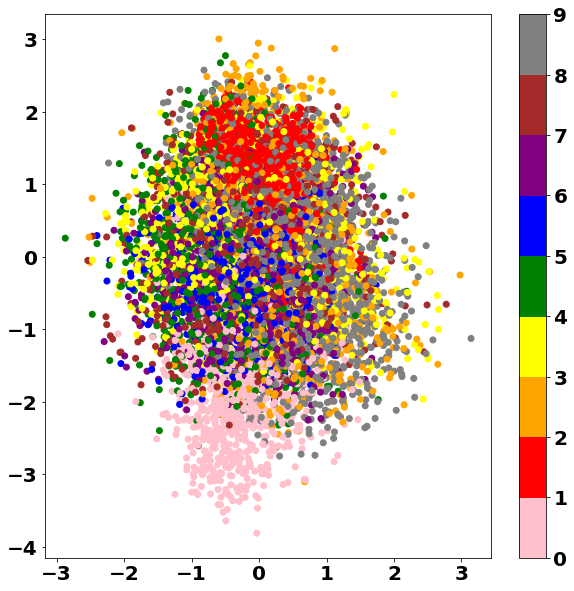

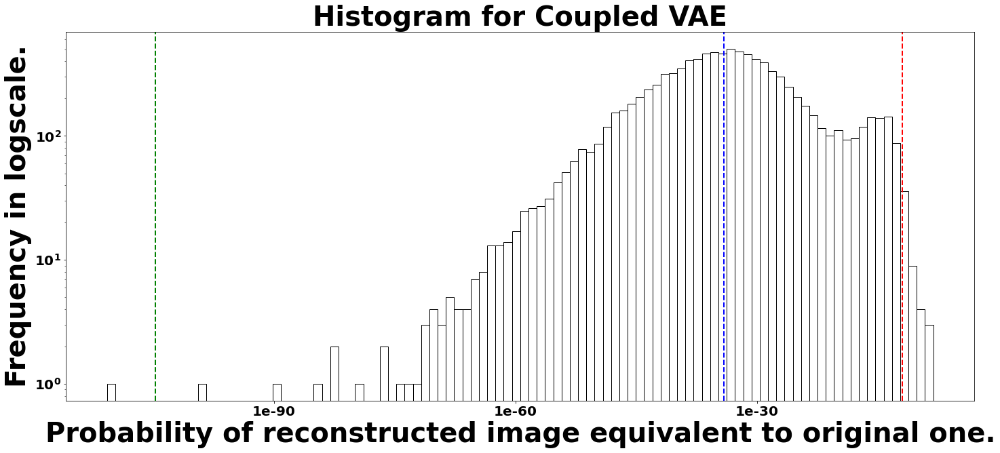

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd0.05_cl0.025/assets
Decisiveness (Arithmetic Mean): 1.2478e-12
Accuracy (Geometric Mean): 7.9530e-35
Robustness (-2/3 Mean): 1.9105e-105
Run time: 7.26 min

Displaying Coupled VAE: coupling distribution = 0.05, coupling loss = 0.05, seed = 0


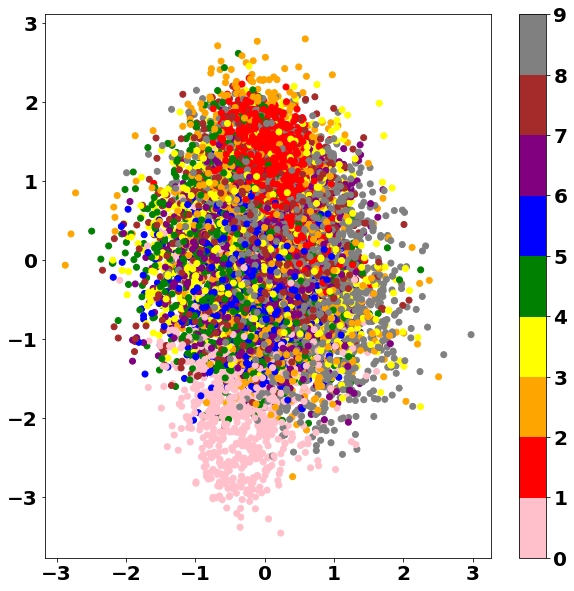

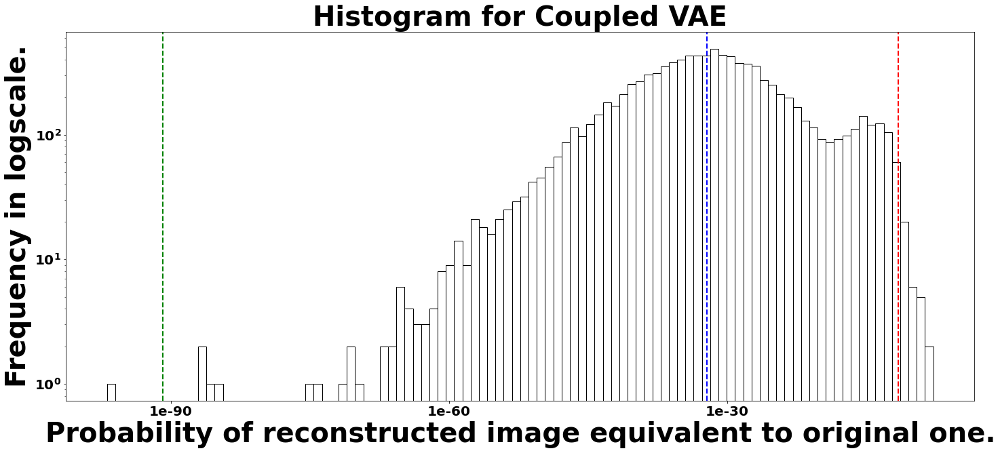

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd0.05_cl0.05/assets
Decisiveness (Arithmetic Mean): 2.9976e-12
Accuracy (Geometric Mean): 7.1479e-33
Robustness (-2/3 Mean): 1.3625e-91
Run time: 7.24 min

Displaying Coupled VAE: coupling distribution = 0.05, coupling loss = 0.075, seed = 0


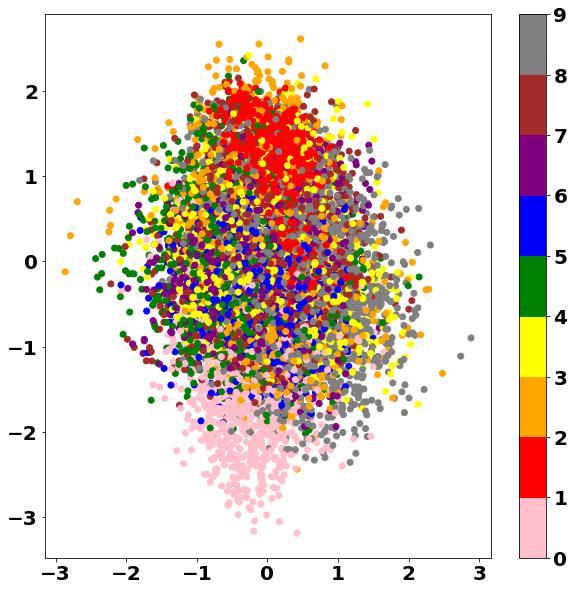

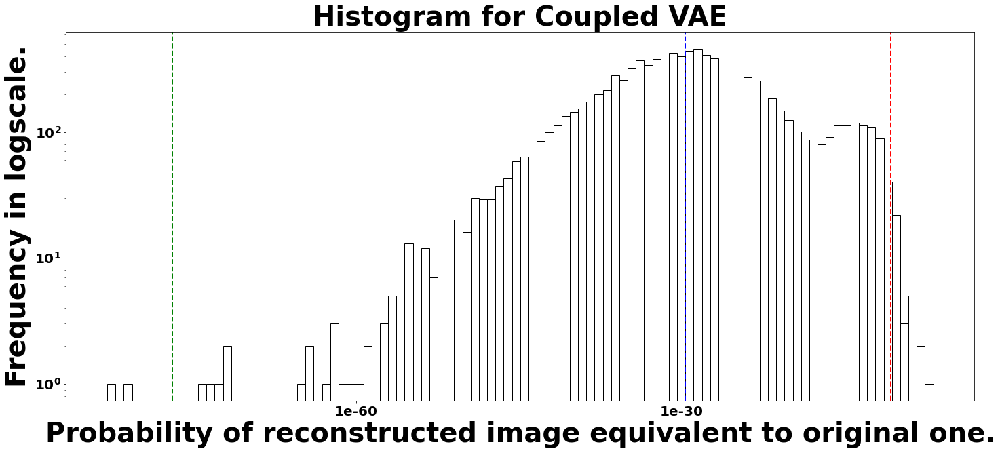

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd0.05_cl0.075/assets
Decisiveness (Arithmetic Mean): 1.7831e-11
Accuracy (Geometric Mean): 2.1818e-30
Robustness (-2/3 Mean): 1.0939e-77
Run time: 7.39 min

Displaying Coupled VAE: coupling distribution = 0.05, coupling loss = 0.1, seed = 0


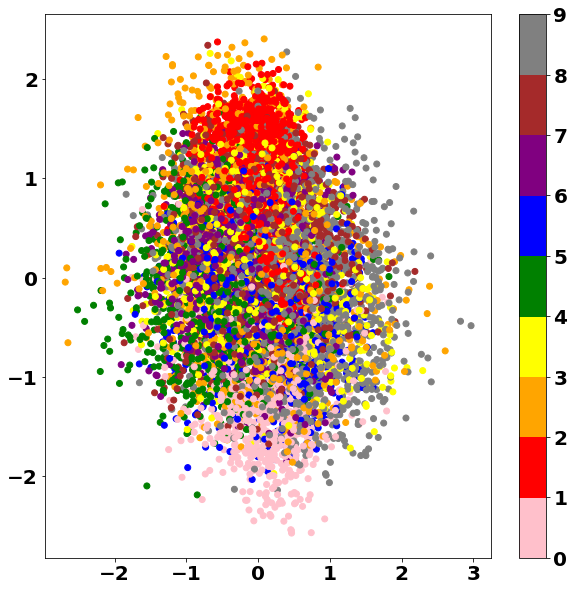

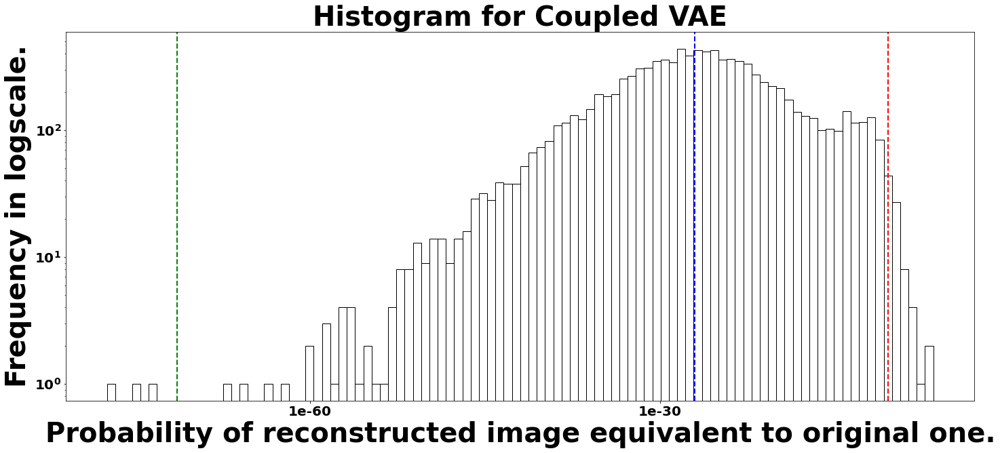

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd0.05_cl0.1/assets
Decisiveness (Arithmetic Mean): 3.6788e-11
Accuracy (Geometric Mean): 9.9569e-28
Robustness (-2/3 Mean): 4.2840e-72
Run time: 7.40 min

Displaying Coupled VAE: coupling distribution = 0.05, coupling loss = 0.125, seed = 0


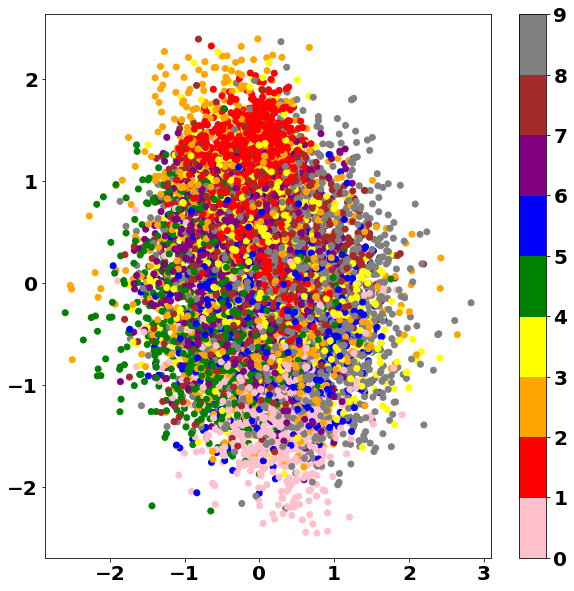

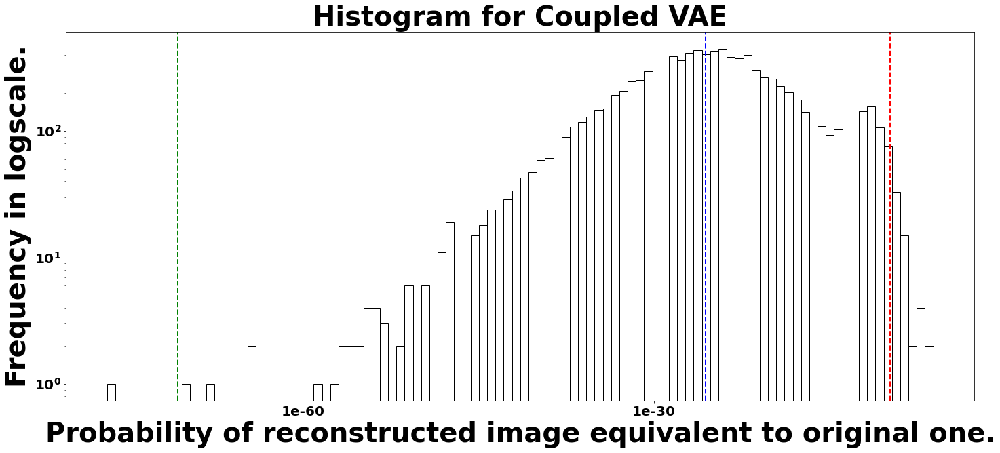

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd0.05_cl0.125/assets
Decisiveness (Arithmetic Mean): 1.5962e-10
Accuracy (Geometric Mean): 2.5430e-26
Robustness (-2/3 Mean): 1.9992e-71
Run time: 7.27 min

Displaying Coupled VAE: coupling distribution = 0.05, coupling loss = 0.15, seed = 0


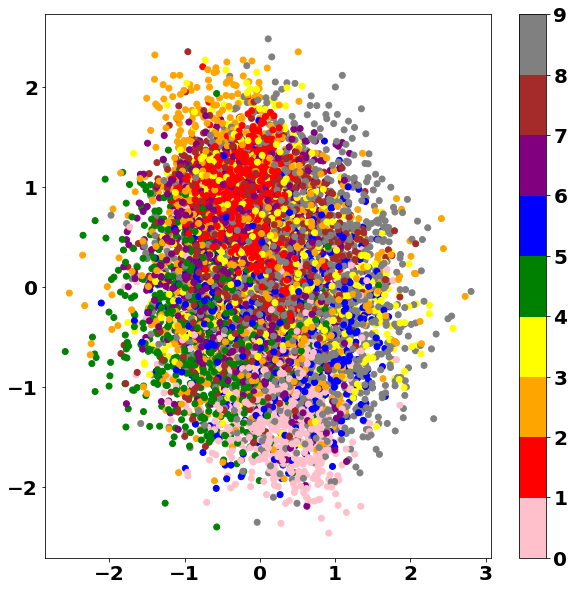

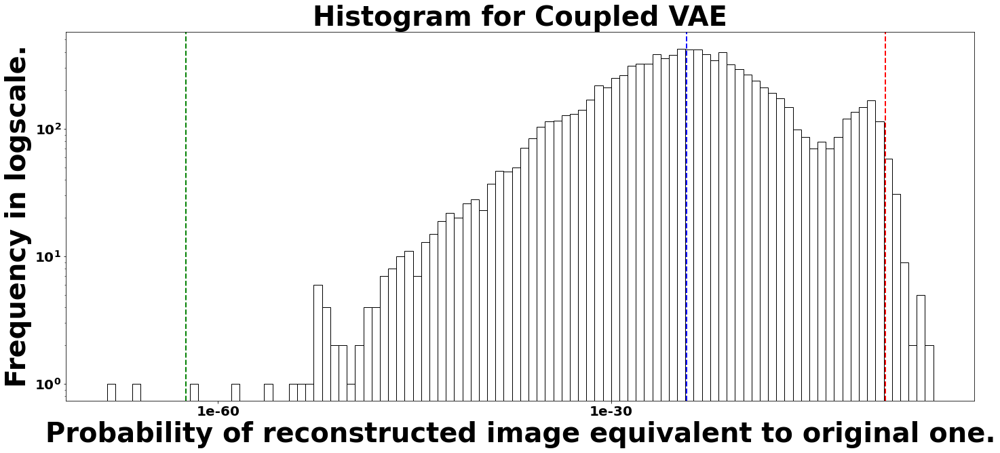

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd0.05_cl0.15/assets
Decisiveness (Arithmetic Mean): 8.3400e-10
Accuracy (Geometric Mean): 5.9469e-25
Robustness (-2/3 Mean): 3.4150e-63
Run time: 7.39 min

Displaying Coupled VAE: coupling distribution = 0.05, coupling loss = 0.175, seed = 0


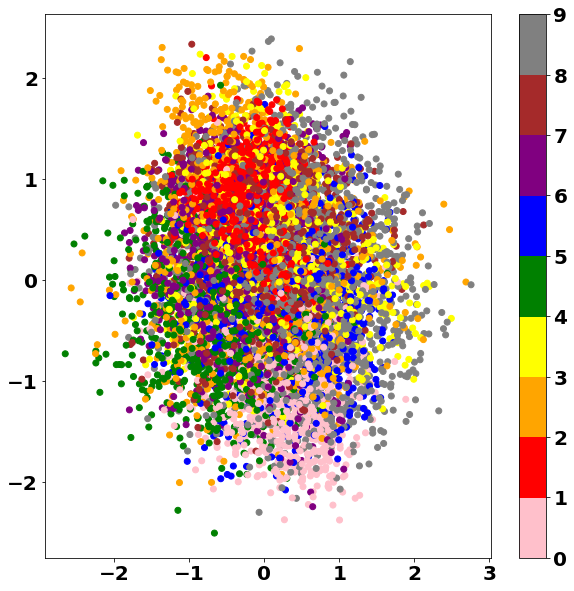

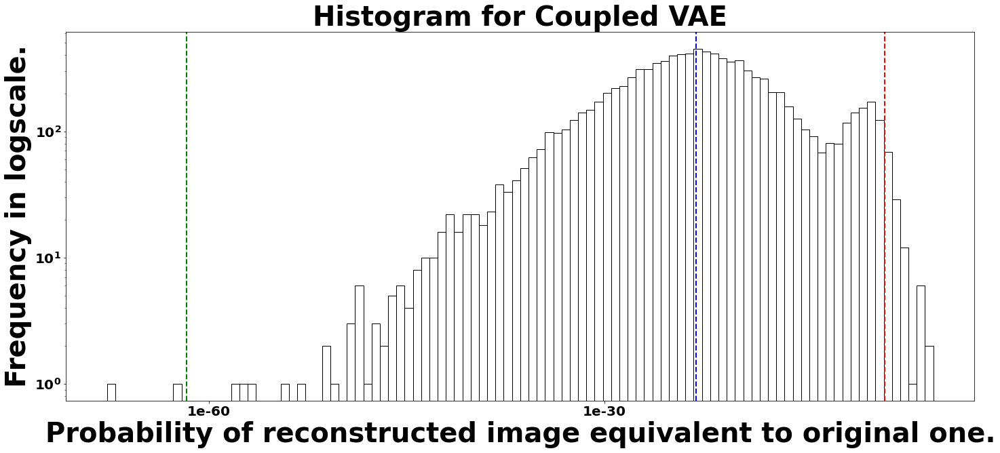

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd0.05_cl0.175/assets
Decisiveness (Arithmetic Mean): 1.8560e-09
Accuracy (Geometric Mean): 9.1161e-24
Robustness (-2/3 Mean): 2.0221e-62
Run time: 7.35 min

Displaying Coupled VAE: coupling distribution = 0.05, coupling loss = 0.2, seed = 0


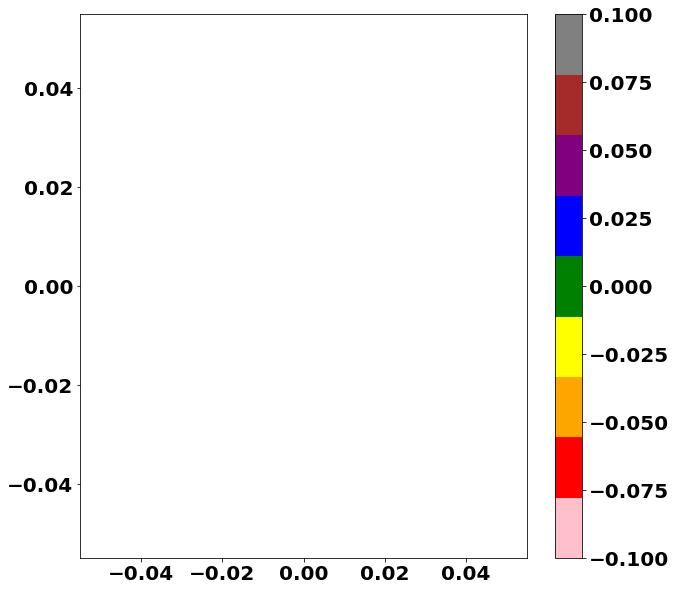

Failed to retrieve generalized mean values due to ValueError, thus set to NaN.
Run time: 7.37 min

Displaying Coupled VAE: coupling distribution = 0.05, coupling loss = 0.225, seed = 0


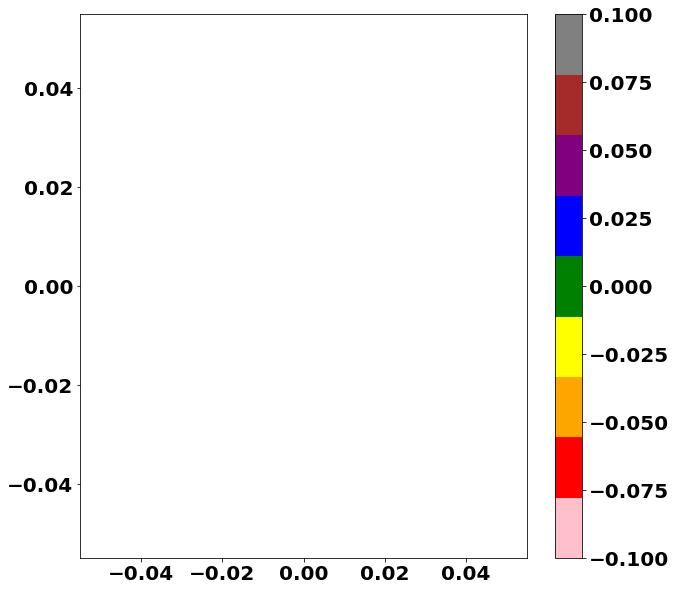

Failed to retrieve generalized mean values due to ValueError, thus set to NaN.
Run time: 7.47 min

Displaying Coupled VAE: coupling distribution = 0.05, coupling loss = 0.25, seed = 0


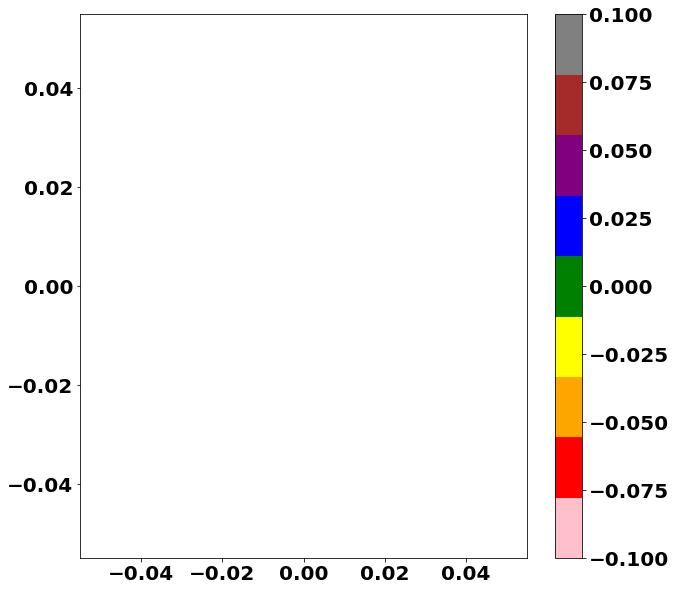

Failed to retrieve generalized mean values due to ValueError, thus set to NaN.
Run time: 7.42 min

Displaying Coupled VAE: coupling distribution = 0.1, coupling loss = 1e-06, seed = 0


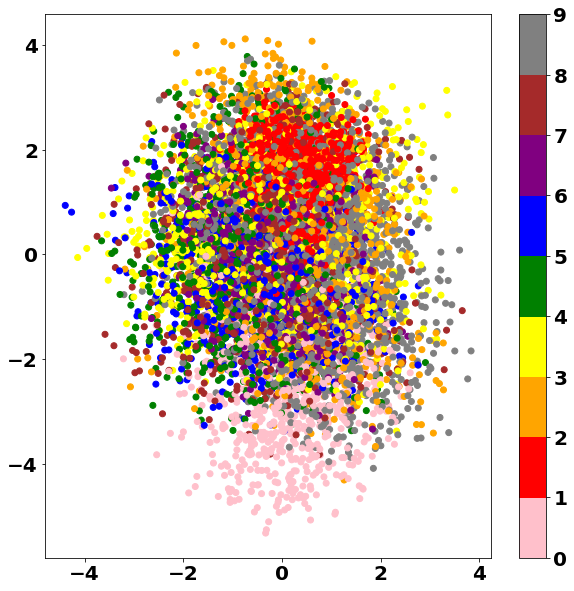

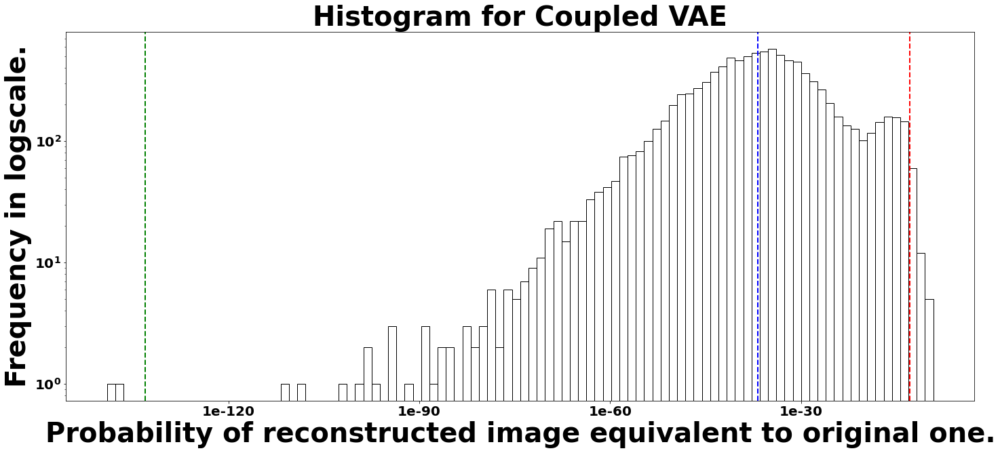

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd0.1_cl1e-06/assets
Decisiveness (Arithmetic Mean): 1.0095e-13
Accuracy (Geometric Mean): 1.5671e-37
Robustness (-2/3 Mean): 9.1472e-134
Run time: 7.28 min

Displaying Coupled VAE: coupling distribution = 0.1, coupling loss = 0.025, seed = 0


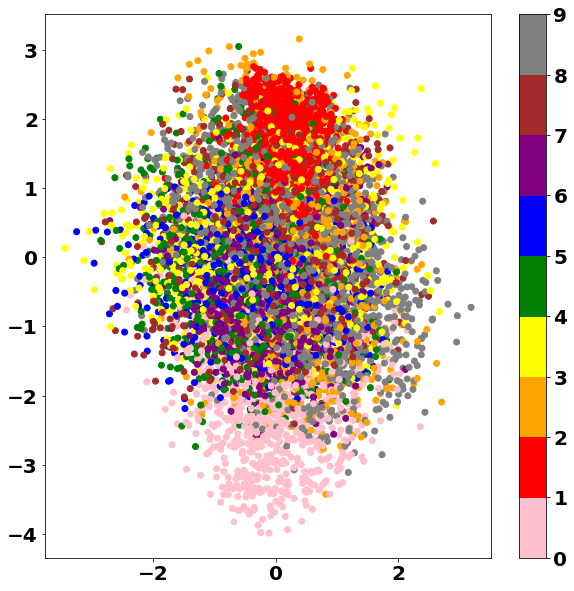

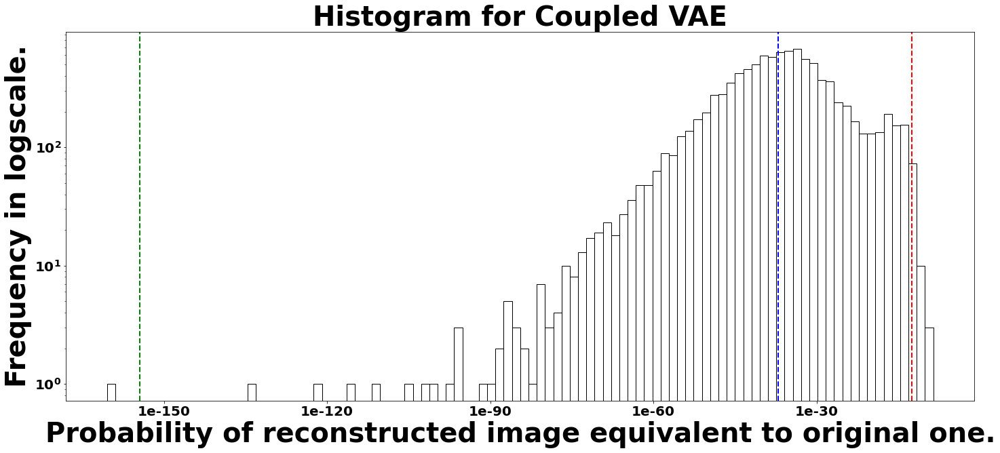

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd0.1_cl0.025/assets
Decisiveness (Arithmetic Mean): 3.5307e-13
Accuracy (Geometric Mean): 9.1228e-38
Robustness (-2/3 Mean): 3.8433e-155
Run time: 7.53 min

Displaying Coupled VAE: coupling distribution = 0.1, coupling loss = 0.05, seed = 0


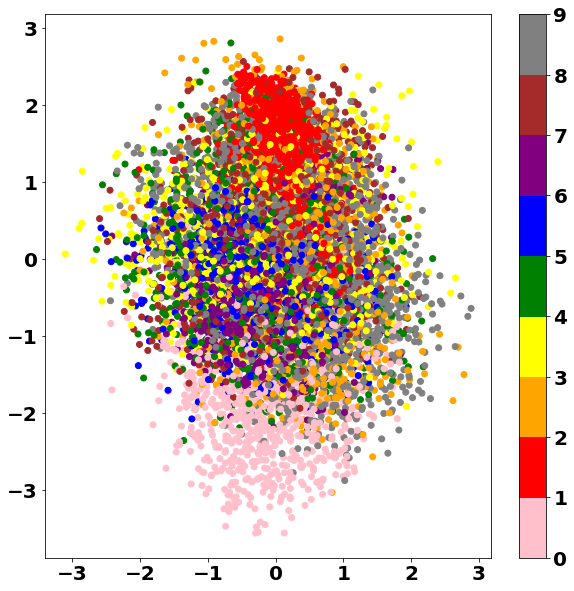

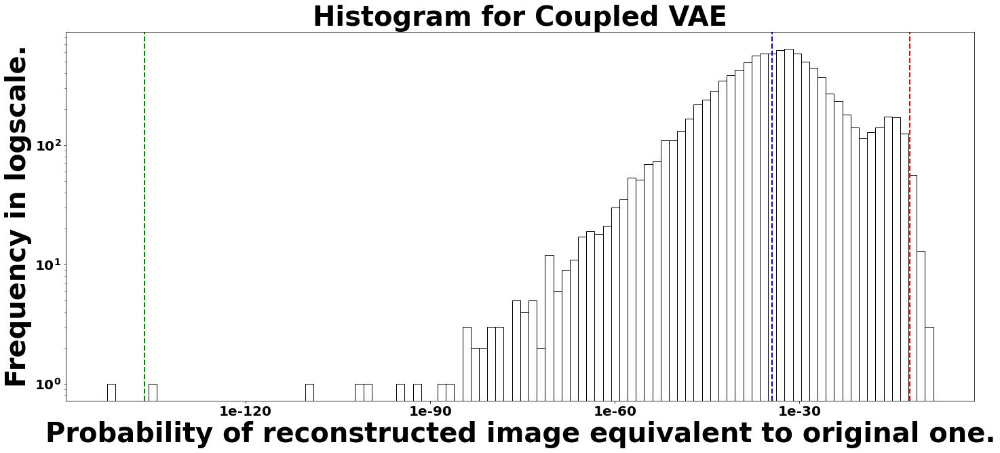

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd0.1_cl0.05/assets
Decisiveness (Arithmetic Mean): 9.2241e-13
Accuracy (Geometric Mean): 3.7604e-35
Robustness (-2/3 Mean): 3.3033e-137
Run time: 7.49 min

Displaying Coupled VAE: coupling distribution = 0.1, coupling loss = 0.075, seed = 0


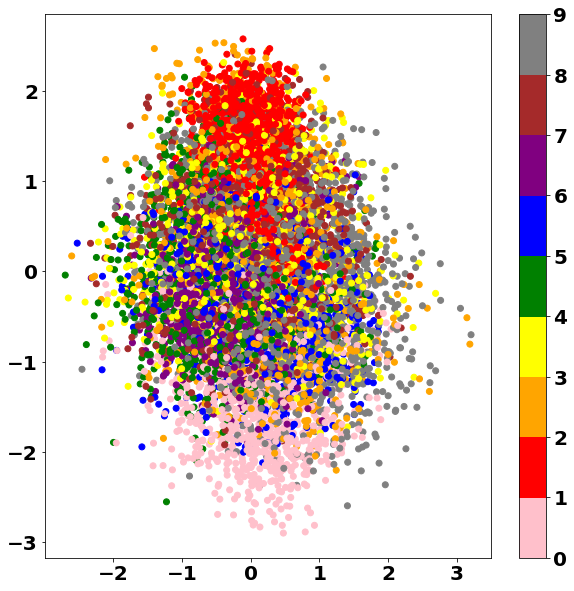

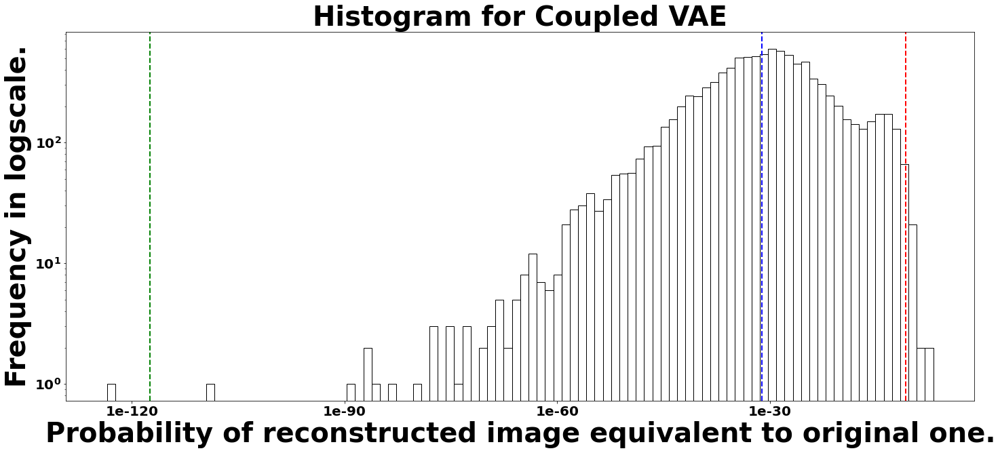

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd0.1_cl0.075/assets
Decisiveness (Arithmetic Mean): 1.3150e-11
Accuracy (Geometric Mean): 7.7747e-32
Robustness (-2/3 Mean): 3.4835e-118
Run time: 7.40 min

Displaying Coupled VAE: coupling distribution = 0.1, coupling loss = 0.1, seed = 0


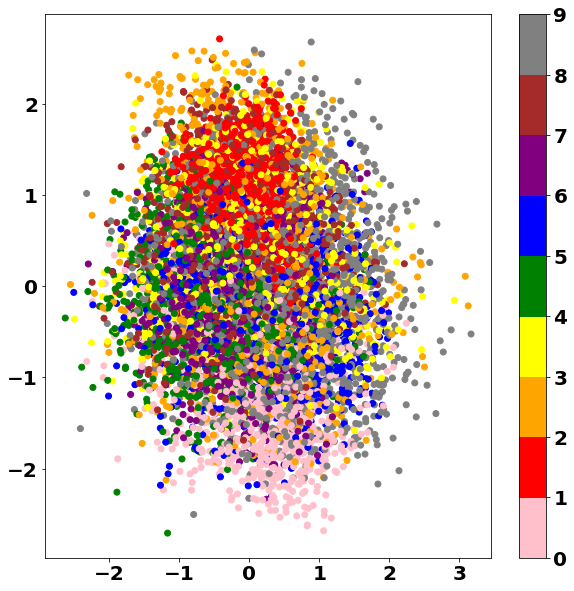

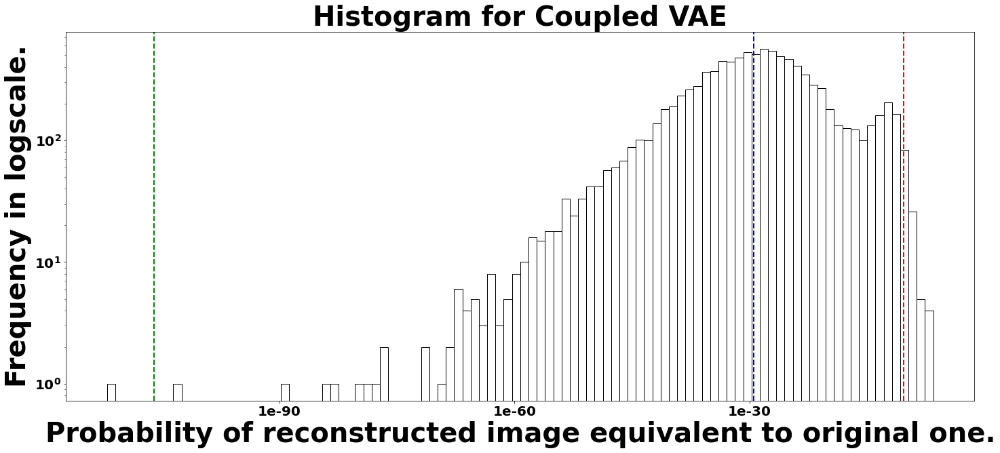

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd0.1_cl0.1/assets
Decisiveness (Arithmetic Mean): 5.4832e-11
Accuracy (Geometric Mean): 3.6143e-30
Robustness (-2/3 Mean): 9.9258e-107
Run time: 7.39 min

Displaying Coupled VAE: coupling distribution = 0.1, coupling loss = 0.125, seed = 0


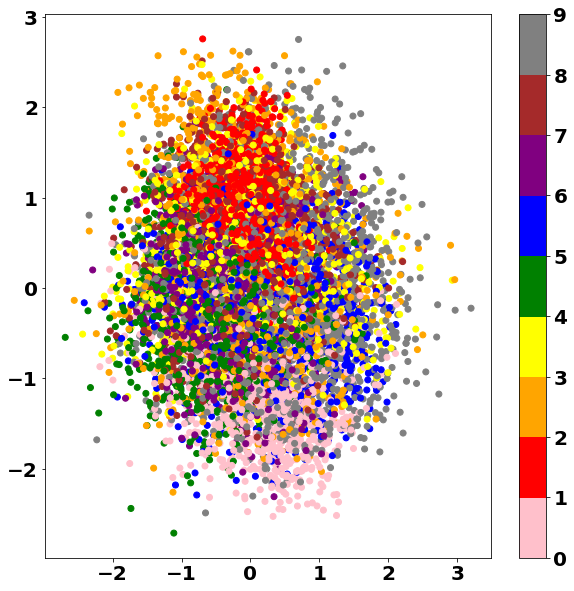

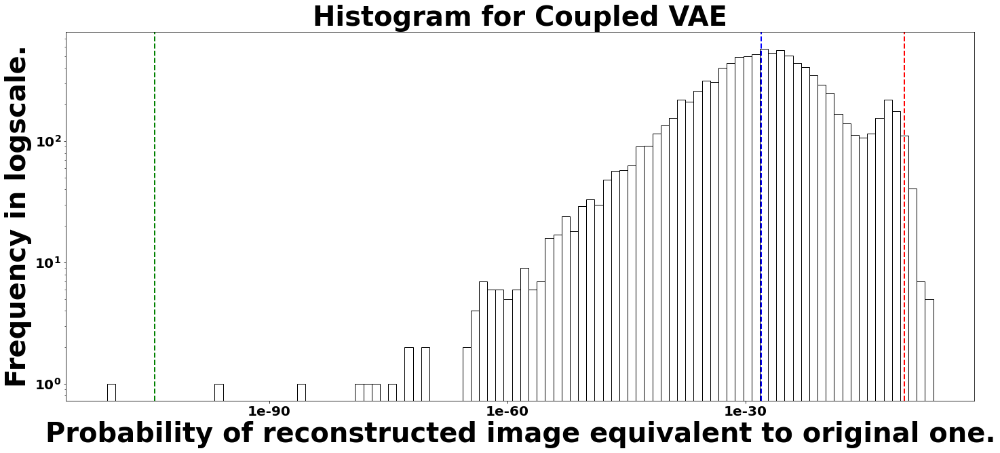

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd0.1_cl0.125/assets
Decisiveness (Arithmetic Mean): 1.0468e-10
Accuracy (Geometric Mean): 9.6950e-29
Robustness (-2/3 Mean): 3.6709e-105
Run time: 7.56 min

Displaying Coupled VAE: coupling distribution = 0.1, coupling loss = 0.15, seed = 0


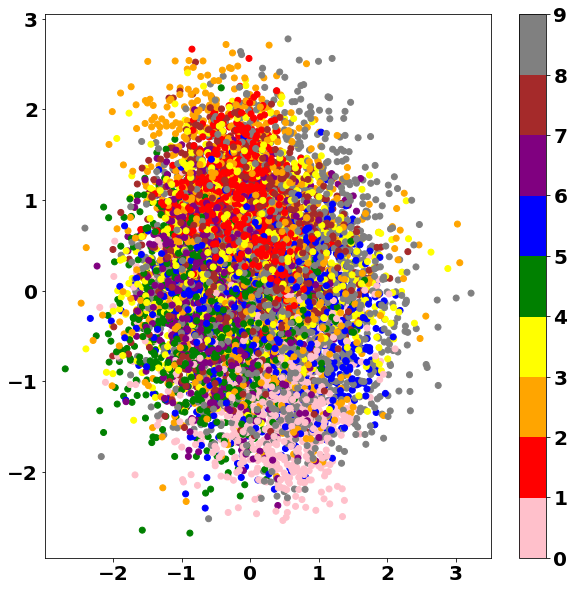

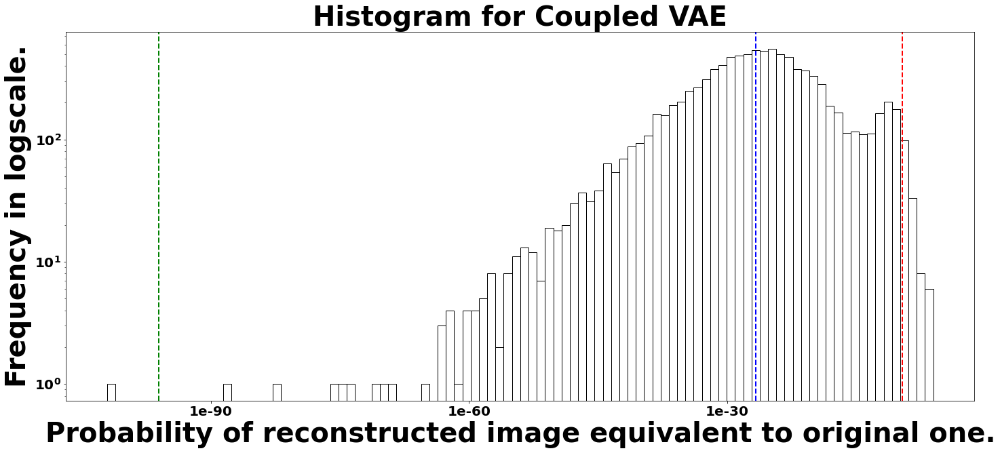

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd0.1_cl0.15/assets
Decisiveness (Arithmetic Mean): 2.2259e-10
Accuracy (Geometric Mean): 2.1339e-27
Robustness (-2/3 Mean): 9.0208e-97
Run time: 7.18 min

Displaying Coupled VAE: coupling distribution = 0.1, coupling loss = 0.175, seed = 0


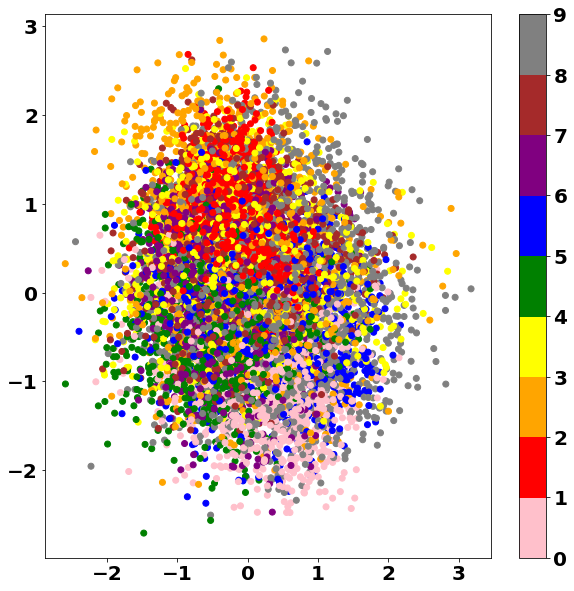

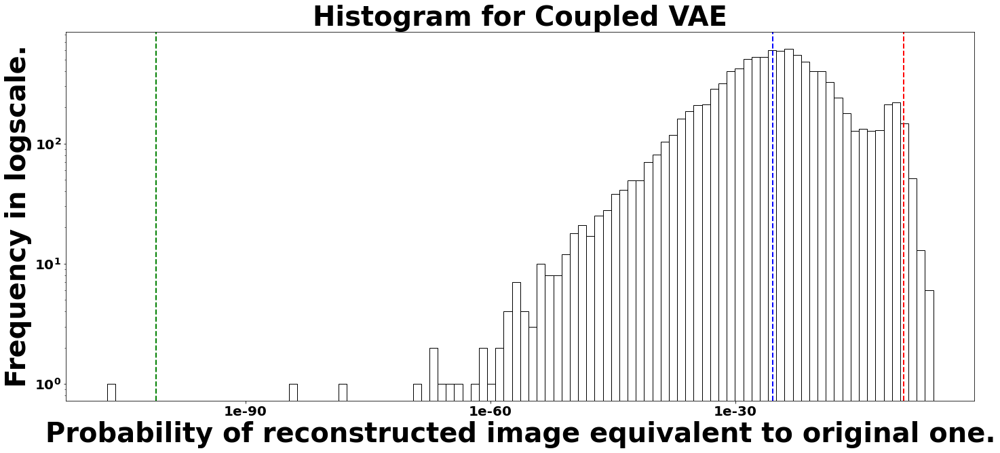

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd0.1_cl0.175/assets
Decisiveness (Arithmetic Mean): 4.3107e-10
Accuracy (Geometric Mean): 3.8751e-26
Robustness (-2/3 Mean): 1.2118e-101
Run time: 7.19 min

Displaying Coupled VAE: coupling distribution = 0.1, coupling loss = 0.2, seed = 0


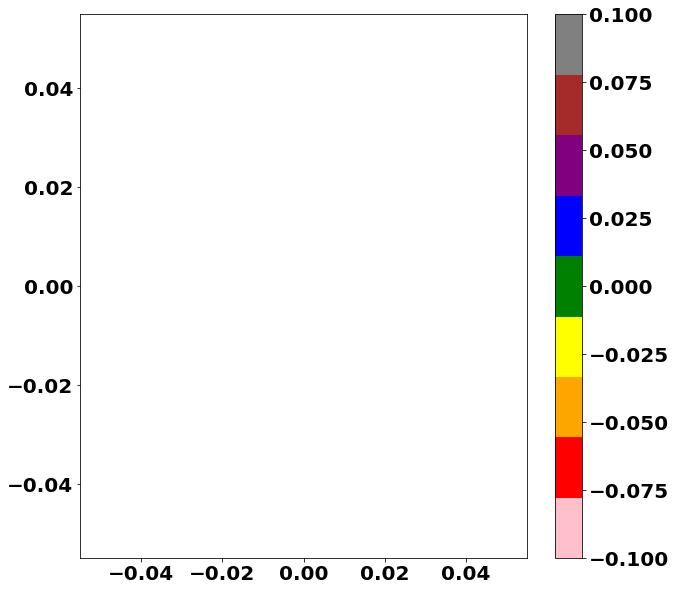

Failed to retrieve generalized mean values due to ValueError, thus set to NaN.
Run time: 7.22 min

Displaying Coupled VAE: coupling distribution = 0.1, coupling loss = 0.225, seed = 0


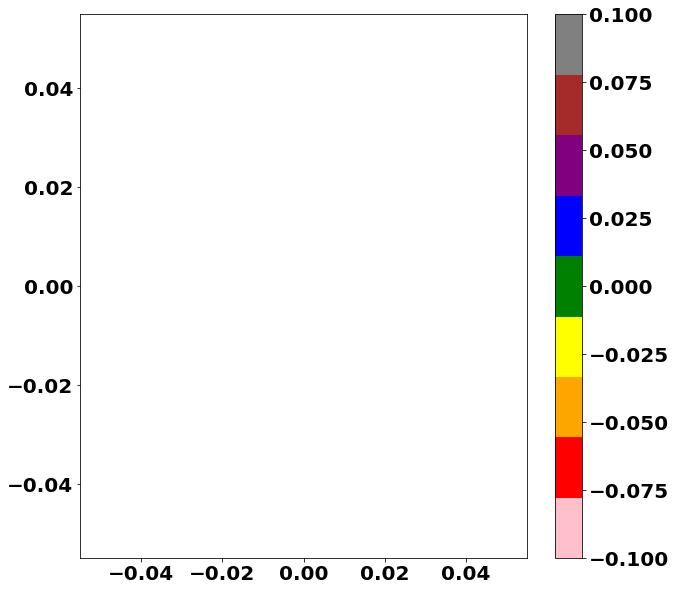

Failed to retrieve generalized mean values due to ValueError, thus set to NaN.
Run time: 7.36 min

Displaying Coupled VAE: coupling distribution = 0.1, coupling loss = 0.25, seed = 0


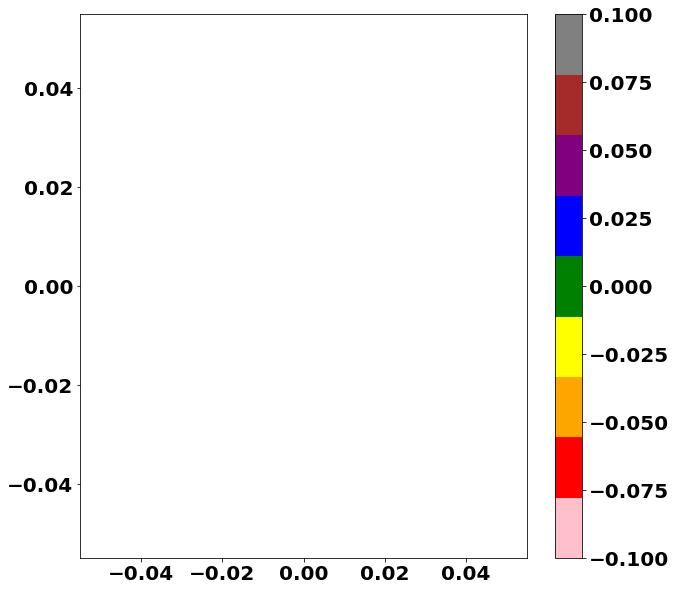

Failed to retrieve generalized mean values due to ValueError, thus set to NaN.
Run time: 7.38 min

Displaying Coupled VAE: coupling distribution = 0.15, coupling loss = 1e-06, seed = 0


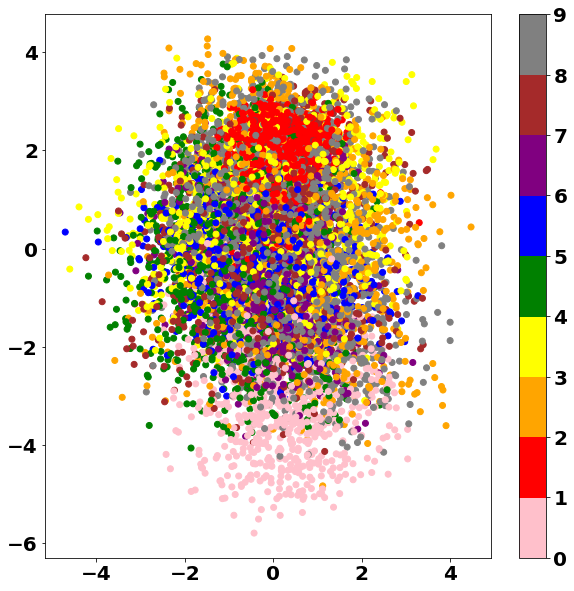

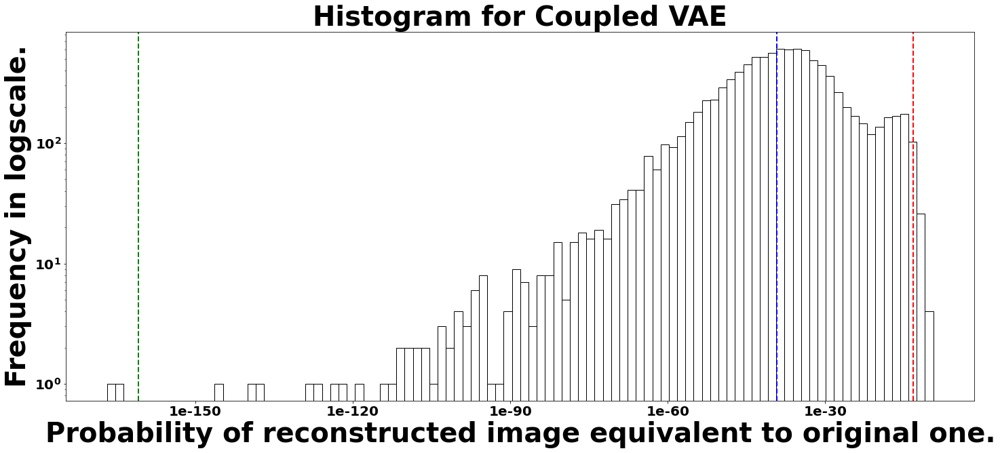

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd0.15_cl1e-06/assets
Decisiveness (Arithmetic Mean): 4.7499e-14
Accuracy (Geometric Mean): 5.8878e-40
Robustness (-2/3 Mean): 1.7047e-161
Run time: 7.64 min

Displaying Coupled VAE: coupling distribution = 0.15, coupling loss = 0.025, seed = 0


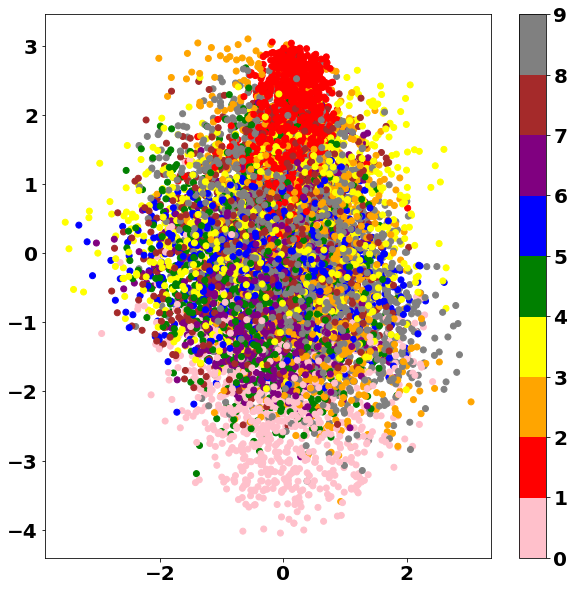

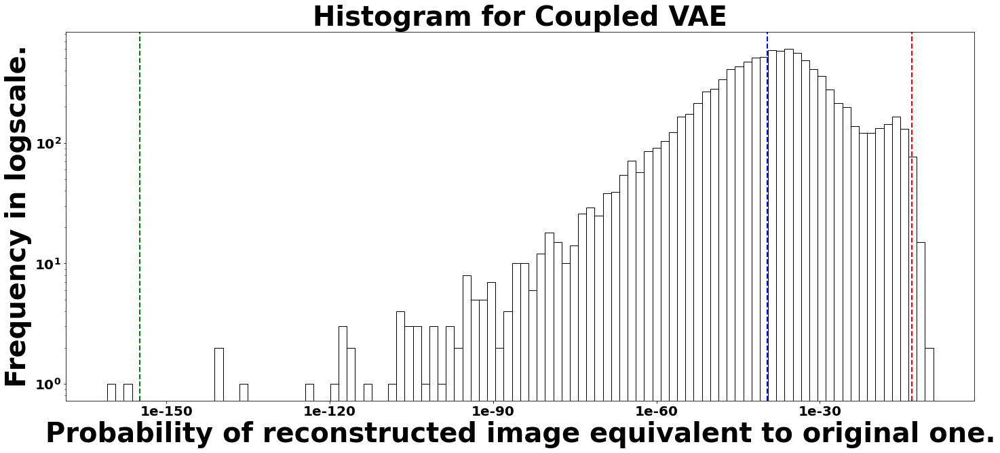

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd0.15_cl0.025/assets
Decisiveness (Arithmetic Mean): 8.0669e-14
Accuracy (Geometric Mean): 2.0901e-40
Robustness (-2/3 Mean): 1.2757e-155
Run time: 7.60 min

Displaying Coupled VAE: coupling distribution = 0.15, coupling loss = 0.05, seed = 0


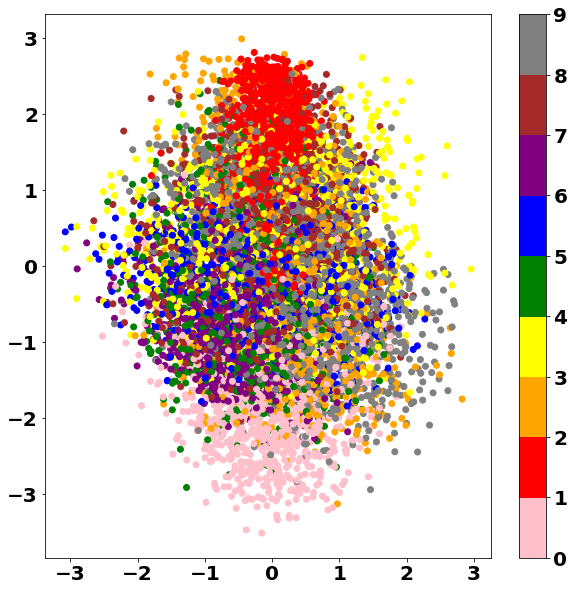

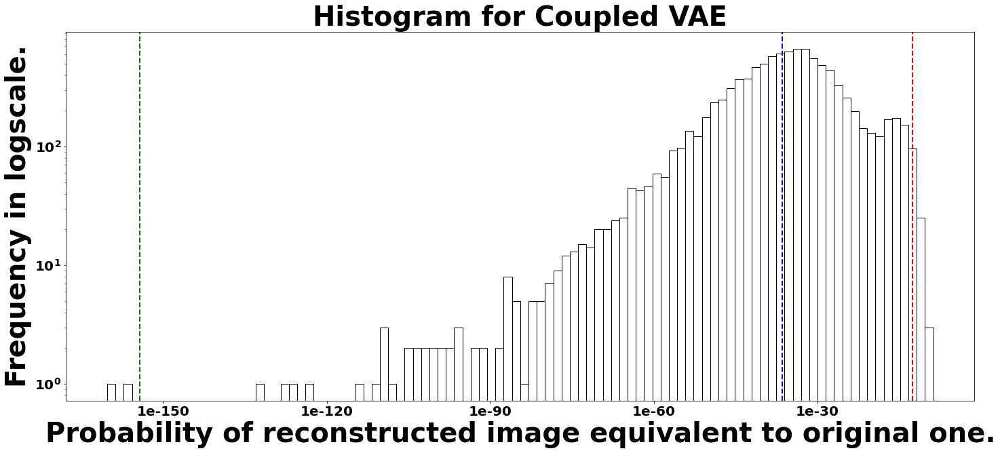

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd0.15_cl0.05/assets
Decisiveness (Arithmetic Mean): 2.5021e-13
Accuracy (Geometric Mean): 3.5508e-37
Robustness (-2/3 Mean): 5.8380e-155
Run time: 7.61 min

Displaying Coupled VAE: coupling distribution = 0.15, coupling loss = 0.075, seed = 0


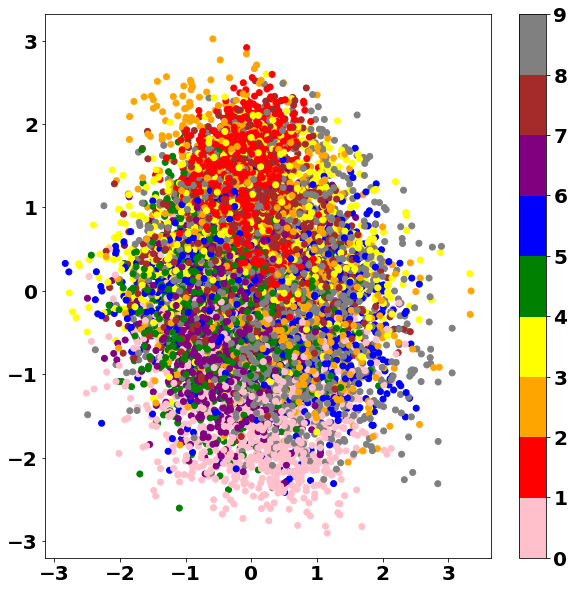

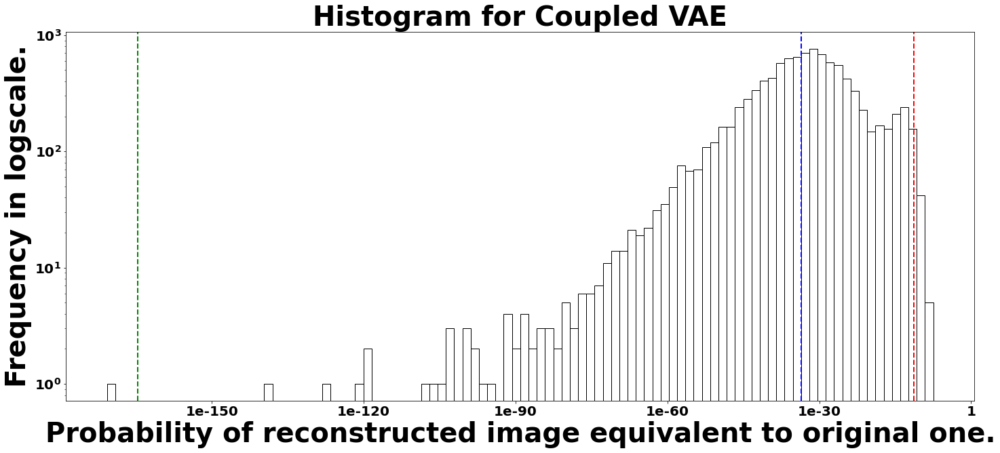

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd0.15_cl0.075/assets
Decisiveness (Arithmetic Mean): 4.8338e-12
Accuracy (Geometric Mean): 3.1979e-34
Robustness (-2/3 Mean): 2.2634e-165
Run time: 7.65 min

Displaying Coupled VAE: coupling distribution = 0.15, coupling loss = 0.1, seed = 0


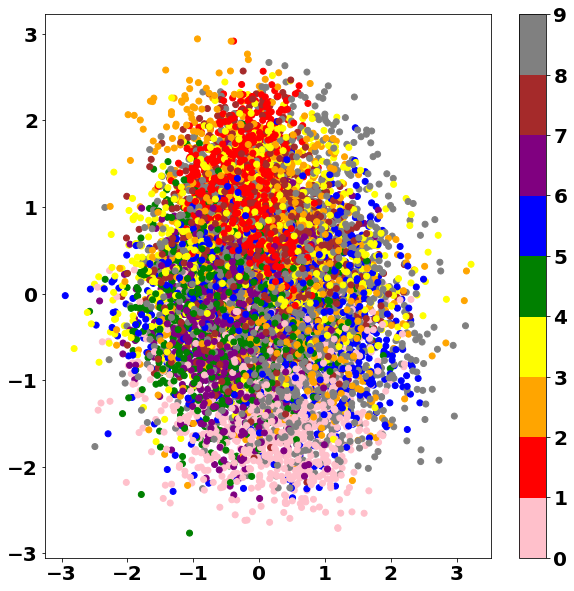

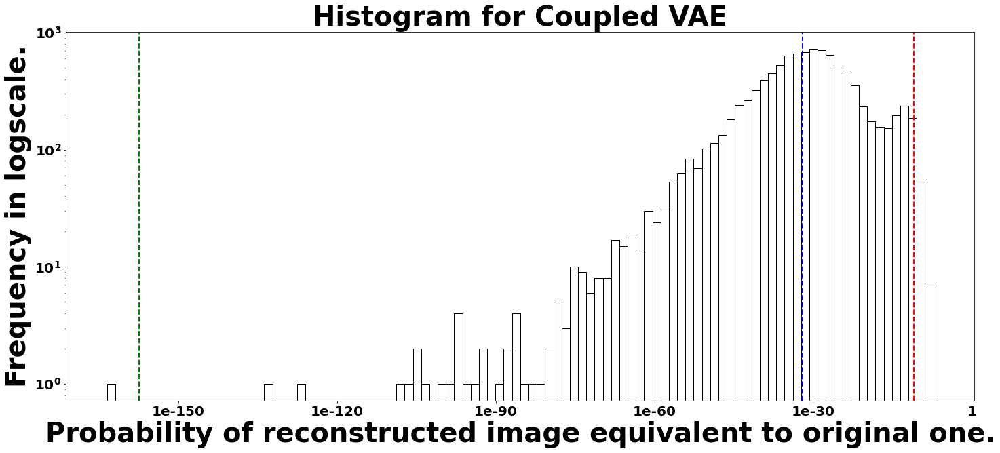

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd0.15_cl0.1/assets
Decisiveness (Arithmetic Mean): 1.0223e-11
Accuracy (Geometric Mean): 1.1679e-32
Robustness (-2/3 Mean): 3.4063e-158
Run time: 7.82 min

Displaying Coupled VAE: coupling distribution = 0.15, coupling loss = 0.125, seed = 0


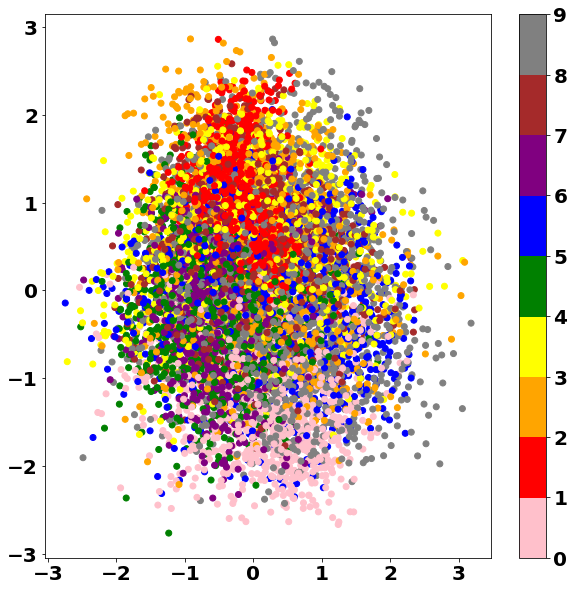

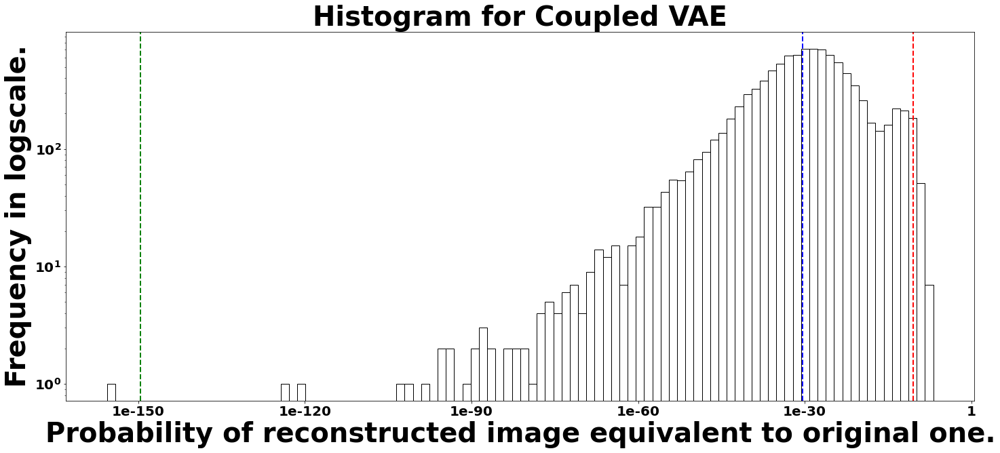

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd0.15_cl0.125/assets
Decisiveness (Arithmetic Mean): 3.3994e-11
Accuracy (Geometric Mean): 3.9159e-31
Robustness (-2/3 Mean): 2.5184e-150
Run time: 8.10 min

Displaying Coupled VAE: coupling distribution = 0.15, coupling loss = 0.15, seed = 0


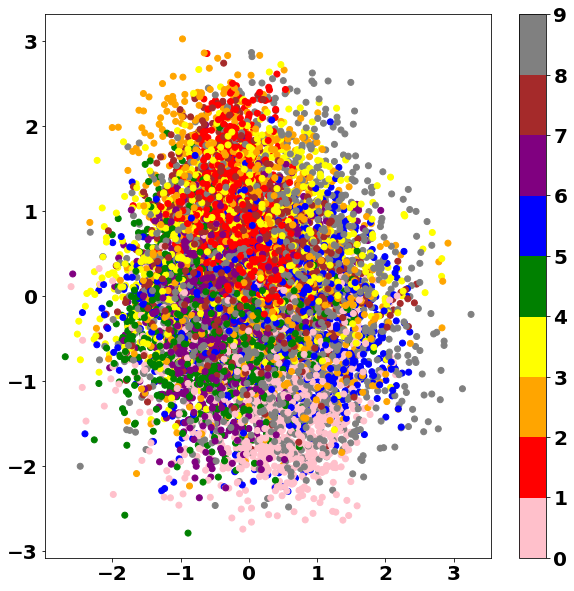

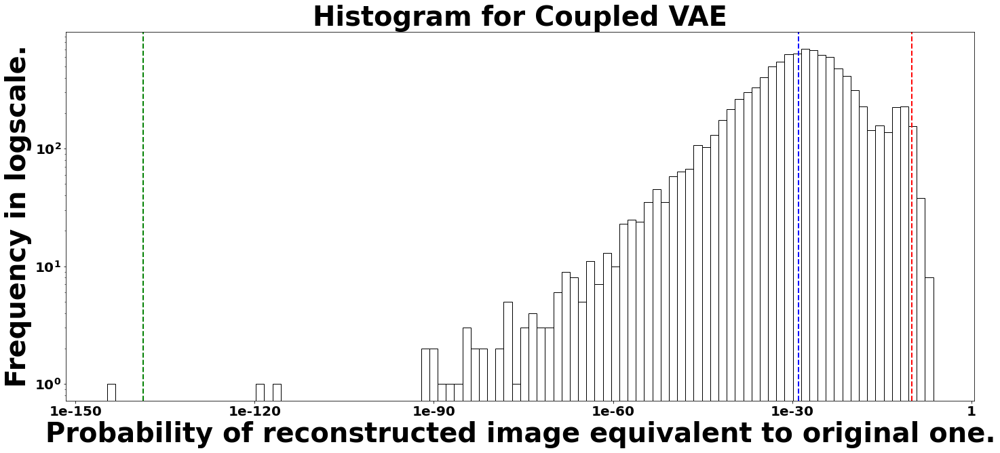

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd0.15_cl0.15/assets
Decisiveness (Arithmetic Mean): 1.0263e-10
Accuracy (Geometric Mean): 1.1046e-29
Robustness (-2/3 Mean): 2.1098e-139
Run time: 8.93 min

Displaying Coupled VAE: coupling distribution = 0.15, coupling loss = 0.175, seed = 0


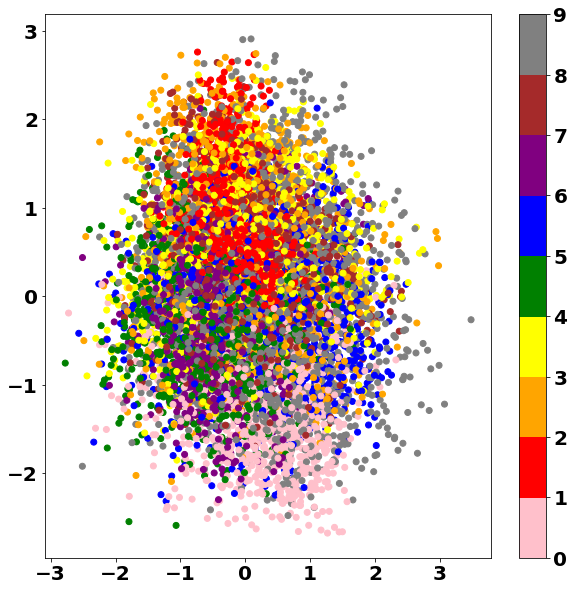

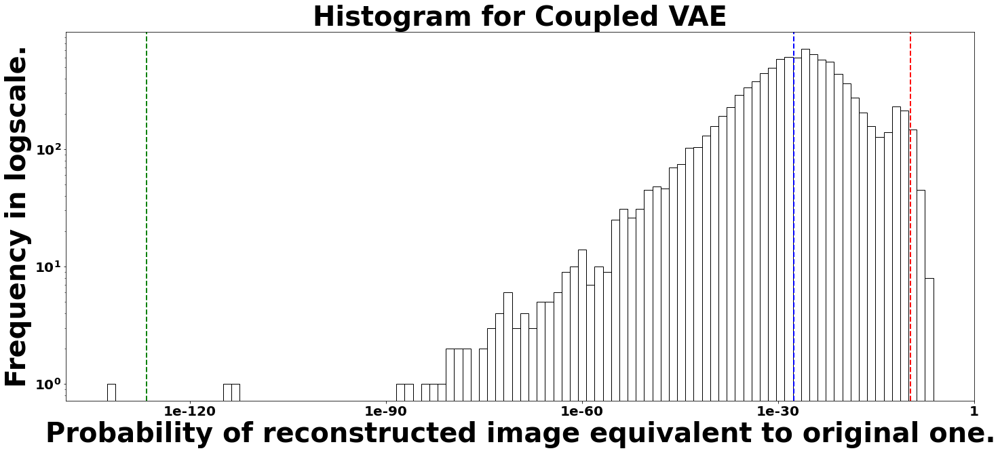

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd0.15_cl0.175/assets
Decisiveness (Arithmetic Mean): 2.0057e-10
Accuracy (Geometric Mean): 2.5294e-28
Robustness (-2/3 Mean): 2.1333e-127
Run time: 8.98 min

Displaying Coupled VAE: coupling distribution = 0.15, coupling loss = 0.2, seed = 0


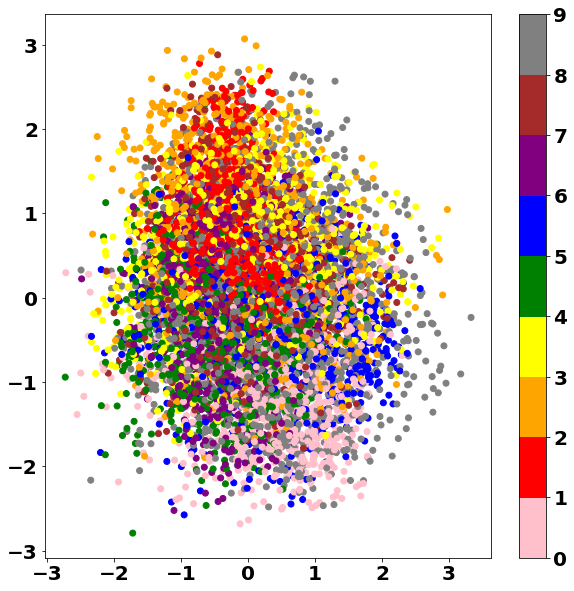

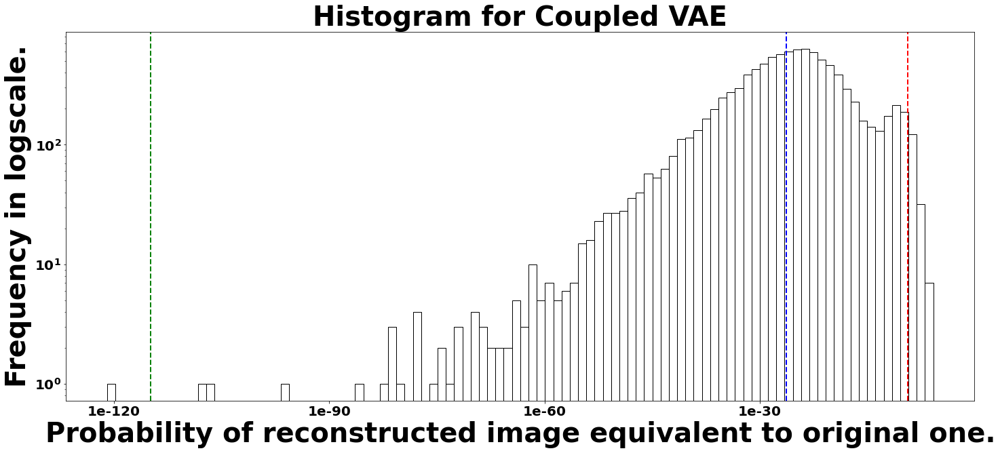

INFO:tensorflow:Assets written to: gdrive/My Drive/Colab Notebooks/coupled_vae/output/v3/seed0/model/cvae_cd0.15_cl0.2/assets
Decisiveness (Arithmetic Mean): 4.4376e-10
Accuracy (Geometric Mean): 4.9281e-27
Robustness (-2/3 Mean): 1.1228e-115
Run time: 8.94 min

Displaying Coupled VAE: coupling distribution = 0.15, coupling loss = 0.225, seed = 0


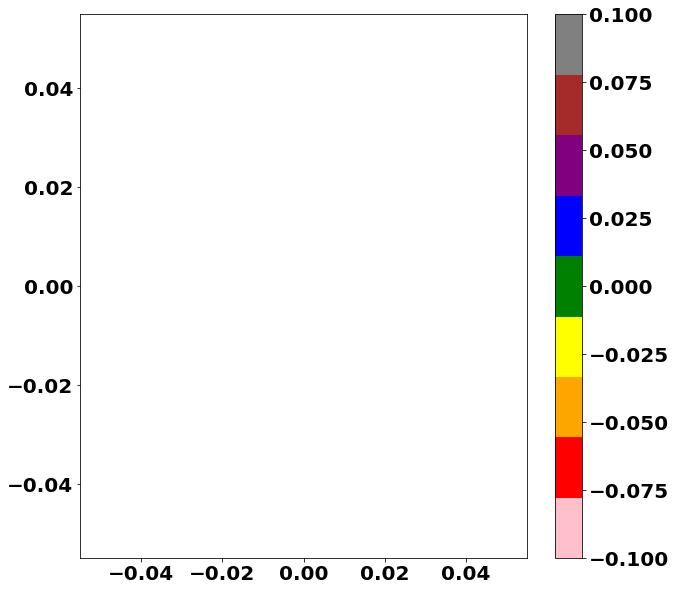

Failed to retrieve generalized mean values due to ValueError, thus set to NaN.
Run time: 8.94 min

Displaying Coupled VAE: coupling distribution = 0.15, coupling loss = 0.25, seed = 0


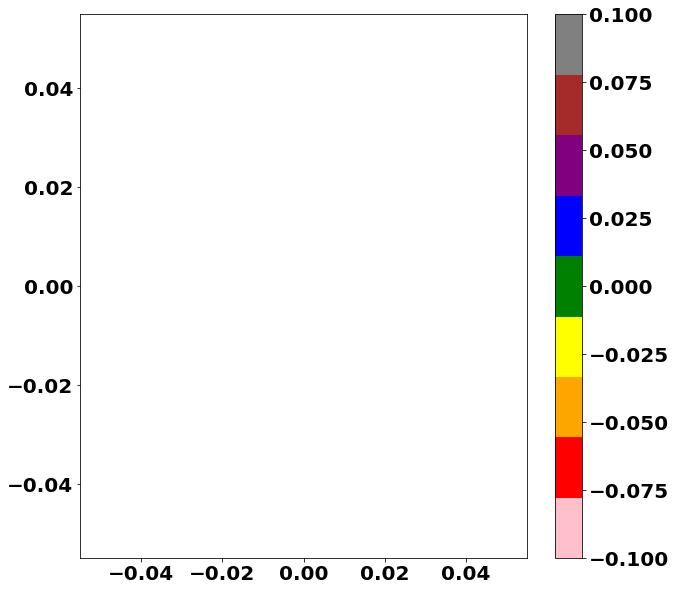

Failed to retrieve generalized mean values due to ValueError, thus set to NaN.
Run time: 9.02 min

CPU times: user 6h 56min 17s, sys: 24min 18s, total: 7h 20min 36s
Wall time: 6h 52min 7s


In [13]:
%%time
for seed_key, cvae_list_seed in cvae_list.items():
    comparison_df = pd.DataFrame(columns=['coupling_dist','coupling_loss','log_decisiveness','log_accuracy','log_robustness'])
    for cvae_key, cvae in cvae_list_seed.items():
        start_time = time.time()
        try:
            cvae.display(X_test, y_test)
            cvae.save_model()
            log_decisiveness, log_accuracy, log_robustness = cvae.get_generalized_mean()
        except ValueError:
            log_decisiveness, log_accuracy, log_robustness = np.NaN, np.NaN, np.NaN, 
            print("Failed to retrieve generalized mean values due to ValueError, thus set to NaN.")
        coupling_dist, coupling_loss = cvae_key.split('_')[1][2:], cvae_key.split('_')[2][2:]
        end_time = time.time()
        run_time = (end_time - start_time)/60
        print(f"Run time: {run_time:.2f} min")
        print()
        comparison_df = comparison_df.append({'coupling_dist': coupling_dist,
                                              'coupling_loss': coupling_loss,
                                              'log_decisiveness': log_decisiveness,
                                              'log_accuracy': log_accuracy,
                                              'log_robustness': log_robustness,
                                              'run_time': f'{run_time:.2f}',
                                              }, ignore_index=True
                                             )
    comparison[seed_key] = comparison_df

In [14]:
for key, table in comparison.items():
    print(table)
    table.to_csv(f"{save_path}/{key}/result/comparison.csv", header=True, index=False)

   coupling_dist coupling_loss  ...  log_robustness  run_time
0          1e-06         1e-06  ...    3.464124e-81      7.53
1          1e-06         0.025  ...    7.145935e-70      7.68
2          1e-06          0.05  ...    3.075781e-75      7.74
3          1e-06         0.075  ...    1.085809e-69      7.80
4          1e-06           0.1  ...    4.031820e-61      7.72
5          1e-06         0.125  ...    4.146897e-58      7.62
6          1e-06          0.15  ...             NaN      7.20
7          1e-06         0.175  ...             NaN      7.05
8          1e-06           0.2  ...             NaN      6.91
9          1e-06         0.225  ...             NaN      6.94
10         1e-06          0.25  ...             NaN      6.87
11          0.01         1e-06  ...    2.465115e-76      7.05
12          0.01         0.025  ...    2.737632e-71      7.00
13          0.01          0.05  ...    1.219465e-64      7.16
14          0.01         0.075  ...    3.883128e-64      7.09
15      